In [32]:
# For reading, visualizing, and preprocessing data
import numpy as np
import pandas as pd
import seaborn as sns
import itertools
import time
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn import model_selection
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, matthews_corrcoef, f1_score, precision_score, recall_score, cohen_kappa_score, log_loss, roc_auc_score
from sklearn.metrics import confusion_matrix,make_scorer,classification_report

# Classifiers
from sklearn.model_selection import cross_validate,cross_val_score,KFold,cross_val_predict
from sklearn.svm import NuSVC, SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import StackingClassifier
# from tensorflow.keras.models import Sequential
#from mlxtend.classifier import StackingCVClassifier 

# Used to ignore warnings generated from StackingCVClassifier
import warnings
warnings.simplefilter('ignore')

In [9]:
data = pd.read_csv(".\\numeric_data.csv")
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

In [10]:
numeric_data = data.copy()
numeric_data.drop(columns=numeric_data.columns[0],axis=1,inplace=True)
numeric_data

,count,logged_in,srv_serror_rate,serror_rate,dst_host_serror_rate,dst_host_same_srv_rate,dst_host_srv_serror_rate,dst_host_srv_count,same_srv_rate,flag_OTH,flag_REJ,flag_RSTO,flag_RSTOS0,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,service_IRC,service_X11,service_Z39_50,service_aol,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,service_daytime,service_discard,service_domain,service_domain_u,service_echo,service_eco_i,service_ecr_i,service_efs,service_exec,service_finger,service_ftp,service_ftp_data,service_gopher,service_harvest,service_hostnames,service_http,service_http_2784,service_http_443,service_http_8001,service_imap4,service_iso_tsap,service_klogin,service_kshell,service_ldap,service_link,service_login,service_mtp,service_name,service_netbios_dgm,service_netbios_ns,service_netbios_ssn,service_netstat,service_nnsp,service_nntp,service_ntp_u,service_other,service_pm_dump,service_pop_2,service_pop_3,service_printer,service_private,service_red_i,service_remote_job,service_rje,service_shell,service_smtp,service_sql_net,service_ssh,service_sunrpc,service_supdup,service_systat,service_telnet,service_tftp_u,service_tim_i,service_time,service_urh_i,service_urp_i,service_uucp,service_uucp_path,service_vmnet,service_whois,protocol_type_icmp,protocol_type_tcp,protocol_type_udp,Dos,Probe,R2L,U2R,normal,label,intrusion_no
0,-0.717045,-0.809262,-0.631929,-0.637209,-0.639532,-0.782367,-0.624871,-0.818890,0.771283,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,normal,4
1,-0.620982,-0.809262,-0.631929,-0.637209,-0.639532,-1.161030,-0.624871,-1.035688,-1.321428,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,normal,4
2,0.339648,-0.809262,1.605104,1.602664,1.608759,-0.938287,1.618955,-0.809857,-1.389669,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,Dos,0
3,-0.690846,1.235694,-0.184522,-0.189235,-0.572083,1.066401,-0.602433,1.258754,0.771283,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,normal,4
4,-0.472521,1.235694,-0.631929,-0.637209,-0.639532,1.066401,-0.624871,1.258754,0.771283,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,normal,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125968,0.872361,-0.809262,1.605104,1.602664,1.608759,-0.938287,1.618955,-0.818890,-1.184947,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,Dos,0
125969,-0.717045,-0.809262,-0.631929,-0.637209,-0.639532,0.977304,-0.624871,1.159389,0.771283,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,normal,4
125970,-0.725778,1.235694,-0.631929,-0.637209,0.979238,-0.893738,-0.624871,-0.773724,0.771283,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,normal,4
125971

In [76]:
X = numeric_data.iloc[:,0:93].to_numpy() 
Y = numeric_data['intrusion_no']

In [69]:
def matrix(Y_test,Y_test_pred,name):
    # Calculate the confusion matrix
    conf_matrix = confusion_matrix(y_true=Y_test, y_pred=Y_test_pred)
    # Print the confusion matrix using Matplotlib
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
    ax.set_title(name); 
    for i in range(conf_matrix.shape[0]):
        for j in range(conf_matrix.shape[1]):
            ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='large')

In [70]:
def plot(Y_test,Y_test_pred,name):
    plt.figure(figsize=(22,10))
    plt.plot(Y_test_pred[100:200], label="Prediction", linewidth=2.5,color='blue')
    plt.plot(Y_test[100:200].values, label="Actual_values", linewidth=2.5,color='lightcoral')
    plt.legend(loc="best")
    plt.title(name)
    plt.show()

In [84]:
print('\n')
print("GAUSSIAN NAIVE BAYES MODEL-----------------------------")


# cv_results = cross_validate(nb, X, Y, cv=5)

scoring = {'accuracy' : make_scorer(accuracy_score),
           'precision' : make_scorer(precision_score, average='weighted'),
           'recall' : make_scorer(recall_score, average='weighted'),
           're' : make_scorer(matthews_corrcoef)}
           


nb = GaussianNB() 

score = cross_validate(nb,X,Y, scoring=scoring)

print(score)






GAUSSIAN NAIVE BAYES MODEL-----------------------------
{'fit_time': array([0.37832117, 0.39353251, 0.31461501, 0.31441212, 0.29857445]), 'score_time': array([0.56159973, 0.23013735, 0.18851876, 0.177531  , 0.18988752]), 'test_accuracy': array([0.76864457, 0.64723159, 0.66100417, 0.61967135, 0.66488053]), 'test_precision': array([0.85492379, 0.83759147, 0.841109  , 0.81800283, 0.82799405]), 'test_recall': array([0.76864457, 0.64723159, 0.66100417, 0.61967135, 0.66488053]), 'test_re': array([0.60337603, 0.47207665, 0.48468413, 0.43317315, 0.47849095])}




Decision Tree MODEL-----------------------------
- Training time :  2.6888349056243896
- Testing time :  0.0245969295501709
----------------------------------
- Train Accuracy : 0.9937585584155272
- Train MCC : 0.9891010069583153
- Train F1 score : 0.9937625176114737
- Train Precision : 0.9937824028663369
- Train Recall : 0.9937585584155272
- Train Cohens Kappa Score : 0.9890995441178664
- Train Log Loss : 0.016992009378392084
----------------------------------
- Test Accuracy : 64.8620758086922
- Test MCC : 0.46189399024161987
- Test F1 score : 0.6981788028926529
- Test Precision : 0.8251530214257657
- Test Recall : 0.648620758086922
- Test Cohens Kappa Score : 0.44697184333931983
- Test Log Loss : 0.4572009131498635
----------------------------------
Mean Absolute Error -  0.8172653304227029
Mean Squared Error -  2.2381821790037706
Root Mean Squared Error -  1.4960555400799032
----------------------------------


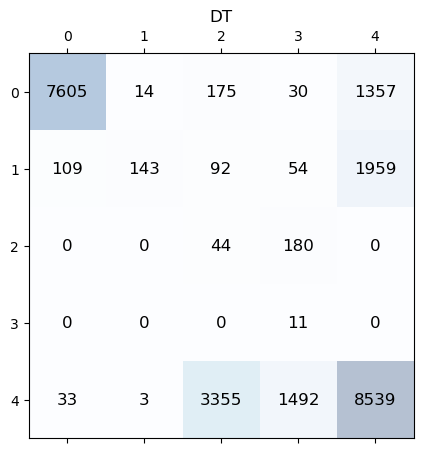

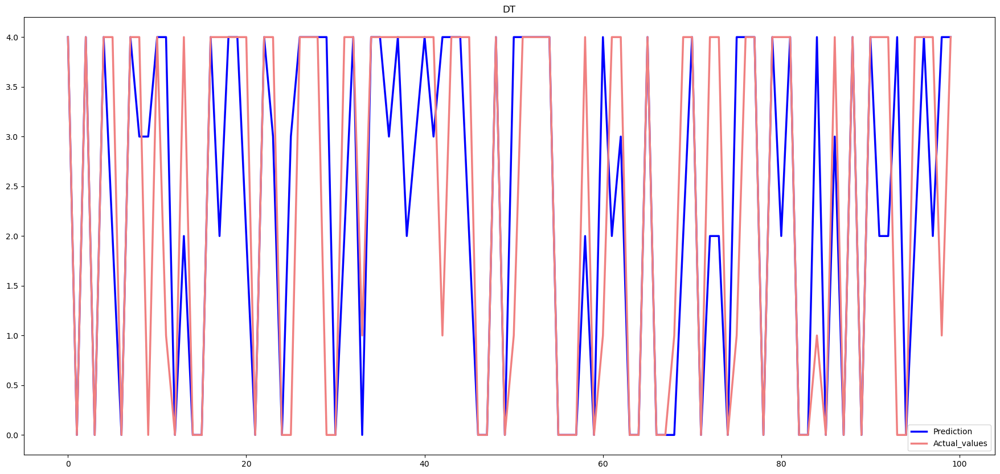

In [16]:
print('\n')
print("Decision Tree MODEL-----------------------------")

dt = DecisionTreeClassifier(criterion='gini')
# dt = DecisionTreeClassifier(random_state = 42)
# dt = DecisionTreeClassifier(random_state=123)
start_time = time.time()
dt.fit(X_train,Y_train)
end_time = time.time()
print("- Training time : ",end_time-start_time)
start_time = time.time()
_test_pred = dt.predict(X_test) 
end_time = time.time()
print("- Testing time : ",end_time-start_time)
print('----------------------------------')
Y_train_pred = dt.predict(X_train)
Y_train_probs = dt.predict_proba(X_train)
Y_test_probs = dt.predict_proba(X_test)

ac=accuracy_score(Y_test, Y_test_pred)*100 


dt_train_accuracy = accuracy_score(Y_train,Y_train_pred)
dt_train_mcc = matthews_corrcoef(Y_train,Y_train_pred)
dt_train_f1 = f1_score(Y_train,Y_train_pred,average = 'weighted')
dt_train_precision = precision_score(Y_train, Y_train_pred,average='weighted')
dt_train_recall = recall_score(Y_train, Y_train_pred, average='weighted')
dt_train_ckscore = cohen_kappa_score(Y_train, Y_train_pred)
dt_train_logloss = log_loss(Y_train, Y_train_probs)
#-----------------------------------------------------------------------
dt_test_mcc = matthews_corrcoef(Y_test,Y_test_pred)
dt_test_f1 = f1_score(Y_test,Y_test_pred,average = 'weighted')
dt_test_precision = precision_score(Y_test, Y_test_pred,average='weighted')
dt_test_recall = recall_score(Y_test, Y_test_pred, average='weighted')
dt_test_ckscore = cohen_kappa_score(Y_test, Y_test_pred)
dt_test_logloss = log_loss(Y_test, Y_test_probs)

print('- Train Accuracy : %s' % dt_train_accuracy)
print('- Train MCC : %s' % dt_train_mcc)
print('- Train F1 score : %s' % dt_train_f1)
print('- Train Precision : %s' % dt_train_precision)
print('- Train Recall : %s' % dt_train_recall)
print('- Train Cohens Kappa Score : %s' % dt_train_ckscore)
print('- Train Log Loss : %s' % dt_train_logloss)
print('----------------------------------')
print('- Test Accuracy : %s' % ac)
print('- Test MCC : %s' % dt_test_mcc)
print('- Test F1 score : %s' % dt_test_f1)
print('- Test Precision : %s' % dt_test_precision)
print('- Test Recall : %s' % dt_test_recall)
print('- Test Cohens Kappa Score : %s' % dt_test_ckscore)
print('- Test Log Loss : %s' % dt_test_logloss)
print('----------------------------------')
print("Mean Absolute Error - " , metrics.mean_absolute_error(Y_test, Y_test_pred))
print("Mean Squared Error - " , metrics.mean_squared_error(Y_test, Y_test_pred))
print("Root Mean Squared Error - " , np.sqrt(metrics.mean_squared_error(Y_test, Y_test_pred)))
print('----------------------------------')
matrix(Y_test, Y_test_pred, "DT")
plot(Y_test, Y_test_pred, "DT")



RANDOM FOREST MODEL-----------------------------
- Training time :  8.801862716674805
- Testing time :  0.2898528575897217
----------------------------------
- Train Accuracy : 0.9936791760106373
- Train MCC : 0.988955226101314
- Train F1 score : 0.9936347887497211
- Train Precision : 0.9936902107992038
- Train Recall : 0.9936791760106373
- Train Cohens Kappa Score : 0.9889487094336159
- Train Log Loss : 0.021083556459488218
----------------------------------
- Test Accuracy : 98.46398094860092
- Test MCC : 0.9732464539129687
- Test F1 score : 0.9844564773999711
- Test Precision : 0.9846381485081684
- Test Recall : 0.9846398094860092
- Test Cohens Kappa Score : 0.9732366193520257
- Test Log Loss : 0.12417557714942117
----------------------------------
Mean Absolute Error -  0.04731097439968247
Mean Squared Error -  0.16336574717205796
Root Mean Squared Error -  0.40418528816875304
----------------------------------


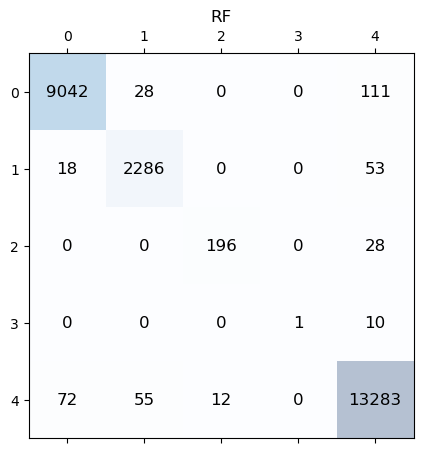

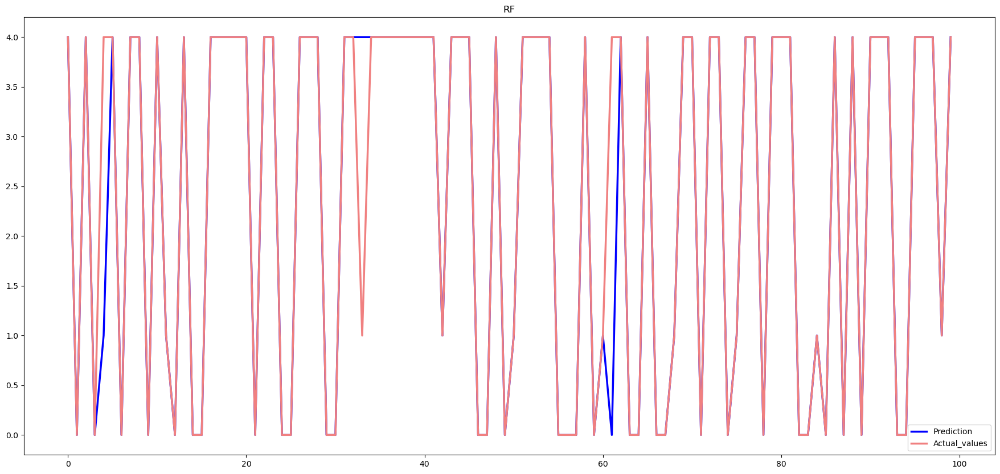

In [9]:
print('\n')
print("RANDOM FOREST MODEL-----------------------------")

rf = RandomForestClassifier(n_estimators=30)
start_time = time.time()
rf.fit(X_train,Y_train)
end_time = time.time()
print("- Training time : ",end_time-start_time)
start_time = time.time()
Y_test_pred = rf.predict(X_test) 
end_time = time.time()
print("- Testing time : ",end_time-start_time)
print('----------------------------------')
Y_train_pred = rf.predict(X_train)
Y_train_probs = rf.predict_proba(X_train)
Y_test_probs = rf.predict_proba(X_test)

ac=accuracy_score(Y_test, Y_test_pred)*100 


rf_train_accuracy = accuracy_score(Y_train,Y_train_pred)
rf_train_mcc = matthews_corrcoef(Y_train,Y_train_pred)
rf_train_f1 = f1_score(Y_train,Y_train_pred,average = 'weighted')
rf_train_precision = precision_score(Y_train, Y_train_pred,average='weighted')
rf_train_recall = recall_score(Y_train, Y_train_pred, average='weighted')
rf_train_ckscore = cohen_kappa_score(Y_train, Y_train_pred)
rf_train_logloss = log_loss(Y_train, Y_train_probs)
#-----------------------------------------------------------------------
rf_test_mcc = matthews_corrcoef(Y_test,Y_test_pred)
rf_test_f1 = f1_score(Y_test,Y_test_pred,average = 'weighted')
rf_test_precision = precision_score(Y_test, Y_test_pred,average='weighted')
rf_test_recall = recall_score(Y_test, Y_test_pred, average='weighted')
rf_test_ckscore = cohen_kappa_score(Y_test, Y_test_pred)
rf_test_logloss = log_loss(Y_test, Y_test_probs)

print('- Train Accuracy : %s' % rf_train_accuracy)
print('- Train MCC : %s' % rf_train_mcc)
print('- Train F1 score : %s' % rf_train_f1)
print('- Train Precision : %s' % rf_train_precision)
print('- Train Recall : %s' % rf_train_recall)
print('- Train Cohens Kappa Score : %s' % rf_train_ckscore)
print('- Train Log Loss : %s' % rf_train_logloss)
print('----------------------------------')
print('- Test Accuracy : %s' % ac)
print('- Test MCC : %s' % rf_test_mcc)
print('- Test F1 score : %s' % rf_test_f1)
print('- Test Precision : %s' % rf_test_precision)
print('- Test Recall : %s' % rf_test_recall)
print('- Test Cohens Kappa Score : %s' % rf_test_ckscore)
print('- Test Log Loss : %s' % rf_test_logloss)
print('----------------------------------')
print("Mean Absolute Error - " , metrics.mean_absolute_error(Y_test, Y_test_pred))
print("Mean Squared Error - " , metrics.mean_squared_error(Y_test, Y_test_pred))
print("Root Mean Squared Error - " , np.sqrt(metrics.mean_squared_error(Y_test, Y_test_pred)))
print('----------------------------------')
matrix(Y_test, Y_test_pred, "RF")
plot(Y_test, Y_test_pred, "RF")



LOGISTIC REGRESSION MODEL-----------------------------
- Training time :  57.18024158477783
- Testing time :  0.013995885848999023
----------------------------------
- Train Accuracy : 0.9551290956359523
- Train MCC : 0.921224542830548
- Train F1 score : 0.9543587024230049
- Train Precision : 0.9542657015524237
- Train Recall : 0.9551290956359523
- Train Cohens Kappa Score : 0.9211498771677339
- Train Log Loss : 0.1405148625486186
----------------------------------
- Test Accuracy : 95.25302639412581
- Test MCC : 0.917018446658201
- Test F1 score : 0.9517506866743032
- Test Precision : 0.9511939362793158
- Test Recall : 0.9525302639412582
- Test Cohens Kappa Score : 0.9169559137975773
- Test Log Loss : 0.14848403938780616
----------------------------------
Mean Absolute Error -  0.10732288152411193
Mean Squared Error -  0.31395118078983925
Root Mean Squared Error -  0.560313466543362
----------------------------------


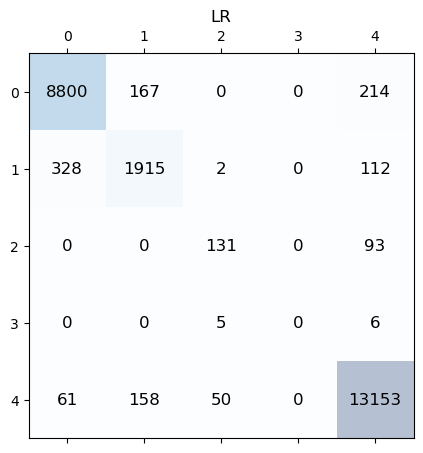

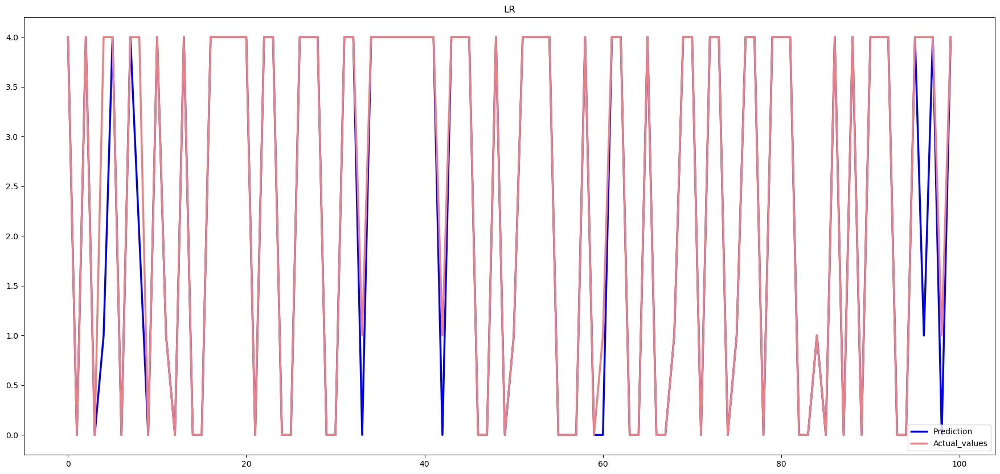

In [10]:
print('\n')
print("LOGISTIC REGRESSION MODEL-----------------------------")

lr = LogisticRegression(max_iter=1200000)
start_time = time.time()
lr.fit(X_train,Y_train)
end_time = time.time()
print("- Training time : ",end_time-start_time)
start_time = time.time()
Y_test_pred = lr.predict(X_test) 
end_time = time.time()
print("- Testing time : ",end_time-start_time)
print('----------------------------------')
Y_train_pred = lr.predict(X_train)
Y_train_probs = lr.predict_proba(X_train)
Y_test_probs = lr.predict_proba(X_test)

ac=accuracy_score(Y_test, Y_test_pred)*100 


lr_train_accuracy = accuracy_score(Y_train,Y_train_pred)
lr_train_mcc = matthews_corrcoef(Y_train,Y_train_pred)
lr_train_f1 = f1_score(Y_train,Y_train_pred,average = 'weighted')
lr_train_precision = precision_score(Y_train, Y_train_pred,average='weighted')
lr_train_recall = recall_score(Y_train, Y_train_pred, average='weighted')
lr_train_ckscore = cohen_kappa_score(Y_train, Y_train_pred)
lr_train_logloss = log_loss(Y_train, Y_train_probs)
#-----------------------------------------------------------------------
lr_test_mcc = matthews_corrcoef(Y_test,Y_test_pred)
lr_test_f1 = f1_score(Y_test,Y_test_pred,average = 'weighted')
lr_test_precision = precision_score(Y_test, Y_test_pred,average='weighted')
lr_test_recall = recall_score(Y_test, Y_test_pred, average='weighted')
lr_test_ckscore = cohen_kappa_score(Y_test, Y_test_pred)
lr_test_logloss = log_loss(Y_test, Y_test_probs)

print('- Train Accuracy : %s' % lr_train_accuracy)
print('- Train MCC : %s' % lr_train_mcc)
print('- Train F1 score : %s' % lr_train_f1)
print('- Train Precision : %s' % lr_train_precision)
print('- Train Recall : %s' % lr_train_recall)
print('- Train Cohens Kappa Score : %s' % lr_train_ckscore)
print('- Train Log Loss : %s' % lr_train_logloss)
print('----------------------------------')
print('- Test Accuracy : %s' % ac)
print('- Test MCC : %s' % lr_test_mcc)
print('- Test F1 score : %s' % lr_test_f1)
print('- Test Precision : %s' % lr_test_precision)
print('- Test Recall : %s' % lr_test_recall)
print('- Test Cohens Kappa Score : %s' % lr_test_ckscore)
print('- Test Log Loss : %s' % lr_test_logloss)
print('----------------------------------')
print("Mean Absolute Error - " , metrics.mean_absolute_error(Y_test, Y_test_pred))
print("Mean Squared Error - " , metrics.mean_squared_error(Y_test, Y_test_pred))
print("Root Mean Squared Error - " , np.sqrt(metrics.mean_squared_error(Y_test, Y_test_pred)))
print('----------------------------------')
matrix(Y_test, Y_test_pred, "LR")
plot(Y_test, Y_test_pred, "LR")



KNN MODEL-----------------------------
- Training time :  0.04351806640625
- Testing time :  117.77564573287964
----------------------------------
- Train Accuracy : 0.9874873484292207
- Train MCC : 0.9781177482680125
- Train F1 score : 0.987337568606527
- Train Precision : 0.987325543098253
- Train Recall : 0.9874873484292207
- Train Cohens Kappa Score : 0.978110933667268
- Train Log Loss : 0.07100675339326751
----------------------------------
- Test Accuracy : 98.33697162135344
- Test MCC : 0.9710376051445443
- Test F1 score : 0.9831957576749697
- Test Precision : 0.9833634979805249
- Test Recall : 0.9833697162135344
- Test Cohens Kappa Score : 0.9710339913825019
- Test Log Loss : 0.21283364160894755
----------------------------------
Mean Absolute Error -  0.04925580472315936
Mean Squared Error -  0.16737447906330621
Root Mean Squared Error -  0.4091142616229679
----------------------------------


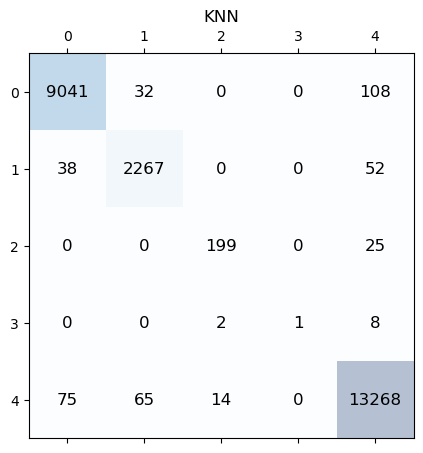

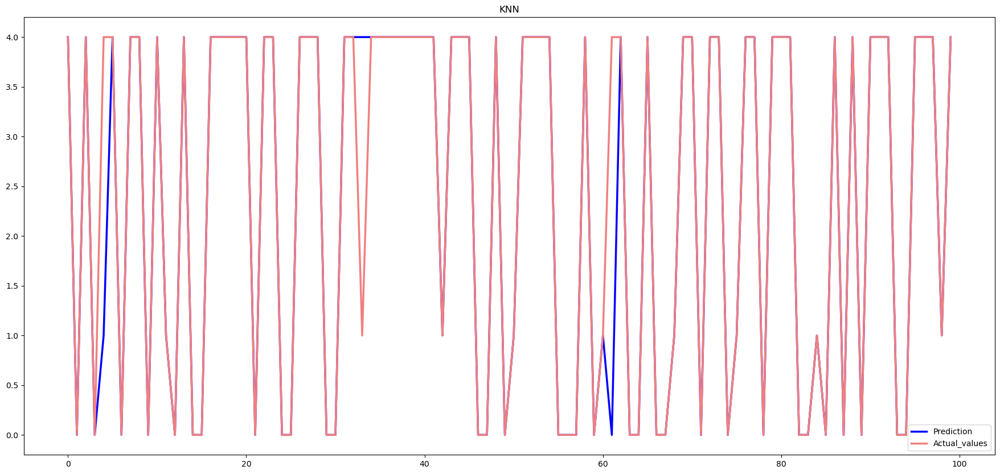

In [11]:
print('\n')
print("KNN MODEL-----------------------------")

knn = KNeighborsClassifier(5)
start_time = time.time()
knn.fit(X_train,Y_train)
end_time = time.time()
print("- Training time : ",end_time-start_time)
start_time = time.time()
Y_test_pred = knn.predict(X_test) 
end_time = time.time()
print("- Testing time : ",end_time-start_time)
print('----------------------------------')
Y_train_pred = knn.predict(X_train)
Y_train_probs = knn.predict_proba(X_train)
Y_test_probs = knn.predict_proba(X_test)

ac=accuracy_score(Y_test, Y_test_pred)*100 

knn_train_accuracy = accuracy_score(Y_train,Y_train_pred)
knn_train_mcc = matthews_corrcoef(Y_train,Y_train_pred)
knn_train_f1 = f1_score(Y_train,Y_train_pred,average = 'weighted')
knn_train_precision = precision_score(Y_train, Y_train_pred,average='weighted')
knn_train_recall = recall_score(Y_train, Y_train_pred, average='weighted')
knn_train_ckscore = cohen_kappa_score(Y_train, Y_train_pred)
knn_train_logloss = log_loss(Y_train, Y_train_probs)
#-----------------------------------------------------------------------
knn_test_mcc = matthews_corrcoef(Y_test,Y_test_pred)
knn_test_f1 = f1_score(Y_test,Y_test_pred,average = 'weighted')
knn_test_precision = precision_score(Y_test, Y_test_pred,average='weighted')
knn_test_recall = recall_score(Y_test, Y_test_pred, average='weighted')
knn_test_ckscore = cohen_kappa_score(Y_test, Y_test_pred)
knn_test_logloss = log_loss(Y_test, Y_test_probs)

print('- Train Accuracy : %s' % knn_train_accuracy)
print('- Train MCC : %s' % knn_train_mcc)
print('- Train F1 score : %s' % knn_train_f1)
print('- Train Precision : %s' % knn_train_precision)
print('- Train Recall : %s' % knn_train_recall)
print('- Train Cohens Kappa Score : %s' % knn_train_ckscore)
print('- Train Log Loss : %s' % knn_train_logloss)
print('----------------------------------')
print('- Test Accuracy : %s' % ac)
print('- Test MCC : %s' % knn_test_mcc)
print('- Test F1 score : %s' % knn_test_f1)
print('- Test Precision : %s' % knn_test_precision)
print('- Test Recall : %s' % knn_test_recall)
print('- Test Cohens Kappa Score : %s' % knn_test_ckscore)
print('- Test Log Loss : %s' % knn_test_logloss)
print('----------------------------------')
print("Mean Absolute Error - " , metrics.mean_absolute_error(Y_test, Y_test_pred))
print("Mean Squared Error - " , metrics.mean_squared_error(Y_test, Y_test_pred))
print("Root Mean Squared Error - " , np.sqrt(metrics.mean_squared_error(Y_test, Y_test_pred)))
print('----------------------------------')
matrix(Y_test, Y_test_pred, "KNN")
plot(Y_test, Y_test_pred, "KNN")



SVM MODEL-----------------------------
- Training time :  4131.749840259552
- Testing time :  51.53001141548157
----------------------------------
- Train Accuracy : 0.9752029212725
- Train MCC : 0.9565176081525785
- Train F1 score : 0.9746369861104005
- Train Precision : 0.9744340181664557
- Train Recall : 0.9752029212725
- Train Cohens Kappa Score : 0.9563866957635379
- Train Log Loss : 0.09546454141236882
----------------------------------
- Test Accuracy : 97.26533042270292
- Test MCC : 0.9522293018664434
- Test F1 score : 0.97207177712289
- Test Precision : 0.9717835229205862
- Test Recall : 0.9726533042270292
- Test Cohens Kappa Score : 0.9521246487260341
- Test Log Loss : 0.10378532883997259
----------------------------------


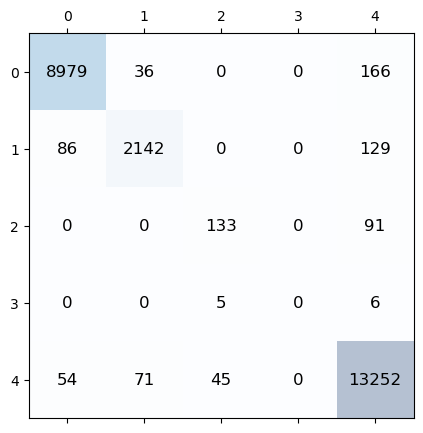

In [23]:
print('\n')
print("SVM MODEL-----------------------------")

svm = SVC(gamma = 'scale',probability=True)
start_time = time.time()
svm.fit(X_train,Y_train)
end_time = time.time()
print("- Training time : ",end_time-start_time)
start_time = time.time()
Y_test_pred = svm.predict(X_test) 
end_time = time.time()
print("- Testing time : ",end_time-start_time)
print('----------------------------------')
Y_train_pred = svm.predict(X_train)
Y_train_probs = svm.predict_proba(X_train)
Y_test_probs = svm.predict_proba(X_test)

ac=accuracy_score(Y_test, Y_test_pred)*100 


svm_train_accuracy = accuracy_score(Y_train,Y_train_pred)
svm_train_mcc = matthews_corrcoef(Y_train,Y_train_pred)
svm_train_f1 = f1_score(Y_train,Y_train_pred,average = 'weighted')
svm_train_precision = precision_score(Y_train, Y_train_pred,average='weighted')
svm_train_recall = recall_score(Y_train, Y_train_pred, average='weighted')
svm_train_ckscore = cohen_kappa_score(Y_train, Y_train_pred)
svm_train_logloss = log_loss(Y_train, Y_train_probs)
#-----------------------------------------------------------------------
svm_test_mcc = matthews_corrcoef(Y_test,Y_test_pred)
svm_test_f1 = f1_score(Y_test,Y_test_pred,average = 'weighted')
svm_test_precision = precision_score(Y_test, Y_test_pred,average='weighted')
svm_test_recall = recall_score(Y_test, Y_test_pred, average='weighted')
svm_test_ckscore = cohen_kappa_score(Y_test, Y_test_pred)
svm_test_logloss = log_loss(Y_test, Y_test_probs)

print('- Train Accuracy : %s' % svm_train_accuracy)
print('- Train MCC : %s' % svm_train_mcc)
print('- Train F1 score : %s' % svm_train_f1)
print('- Train Precision : %s' % svm_train_precision)
print('- Train Recall : %s' % svm_train_recall)
print('- Train Cohens Kappa Score : %s' % svm_train_ckscore)
print('- Train Log Loss : %s' % svm_train_logloss)
print('----------------------------------')
print('- Test Accuracy : %s' % ac)
print('- Test MCC : %s' % svm_test_mcc)
print('- Test F1 score : %s' % svm_test_f1)
print('- Test Precision : %s' % svm_test_precision)
print('- Test Recall : %s' % svm_test_recall)
print('- Test Cohens Kappa Score : %s' % svm_test_ckscore)
print('- Test Log Loss : %s' % svm_test_logloss)
print("Mean Absolute Error - " , metrics.mean_absolute_error(Y_test, Y_test_pred))
print("Mean Squared Error - " , metrics.mean_squared_error(Y_test, Y_test_pred))
print("Root Mean Squared Error - " , np.sqrt(metrics.mean_squared_error(Y_test, Y_test_pred)))
print('----------------------------------')
matrix(Y_test, Y_test_pred, "SVM")
plot(Y_test, Y_test_pred, "SVM")



SVM MODEL-----------------------------
- Training time :  3339.012981414795
- Testing time :  61.29074716567993
----------------------------------
- Train Accuracy : 0.9659151799003751
- Train MCC : 0.9400197935289731
- Train F1 score : 0.9616564935347154
- Train Precision : 0.9580355776281864
- Train Recall : 0.9659151799003751
- Train Cohens Kappa Score : 0.9395856834522057
- Train Log Loss : 0.11351924830088961
----------------------------------
- Test Accuracy : 96.38817225640008
- Test MCC : 0.9366738012877124
- Test F1 score : 0.9590586799264896
- Test Precision : 0.9547559830077572
- Test Recall : 0.9638817225640008
- Test Cohens Kappa Score : 0.9362474733583304
- Test Log Loss : 0.12008340572351615
Mean Absolute Error -  0.08930343322087715
Mean Squared Error -  0.2668783488787458
Root Mean Squared Error -  0.5166026992561554
----------------------------------


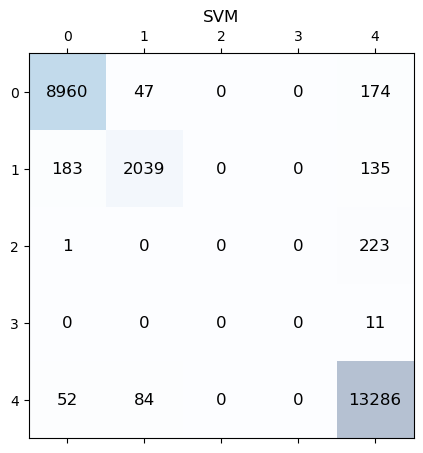

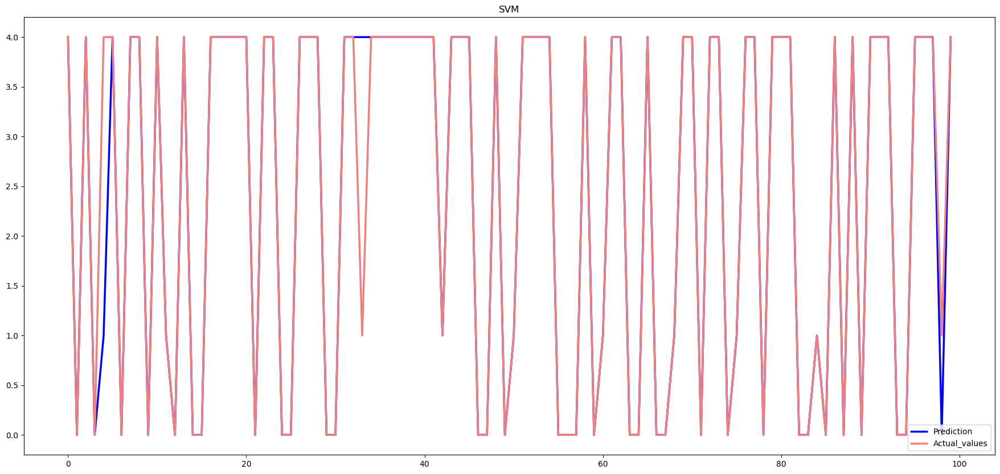

In [12]:
# print('\n')
# print("SVM MODEL-----------------------------")

# svm = SVC(gamma = 'scale',C=0.1, probability=True)
# start_time = time.time()
# svm.fit(X_train,Y_train)
# end_time = time.time()
# print("- Training time : ",end_time-start_time)
# start_time = time.time()
# Y_test_pred = svm.predict(X_test) 
# end_time = time.time()
# print("- Testing time : ",end_time-start_time)
# print('----------------------------------')
# Y_train_pred = svm.predict(X_train)
# Y_train_probs = svm.predict_proba(X_train)
# Y_test_probs = svm.predict_proba(X_test)

# ac=accuracy_score(Y_test, Y_test_pred)*100 


# svm_train_accuracy = accuracy_score(Y_train,Y_train_pred)
# svm_train_mcc = matthews_corrcoef(Y_train,Y_train_pred)
# svm_train_f1 = f1_score(Y_train,Y_train_pred,average = 'weighted')
# svm_train_precision = precision_score(Y_train, Y_train_pred,average='weighted')
# svm_train_recall = recall_score(Y_train, Y_train_pred, average='weighted')
# svm_train_ckscore = cohen_kappa_score(Y_train, Y_train_pred)
# svm_train_logloss = log_loss(Y_train, Y_train_probs)
# #-----------------------------------------------------------------------
# svm_test_mcc = matthews_corrcoef(Y_test,Y_test_pred)
# svm_test_f1 = f1_score(Y_test,Y_test_pred,average = 'weighted')
# svm_test_precision = precision_score(Y_test, Y_test_pred,average='weighted')
# svm_test_recall = recall_score(Y_test, Y_test_pred, average='weighted')
# svm_test_ckscore = cohen_kappa_score(Y_test, Y_test_pred)
# svm_test_logloss = log_loss(Y_test, Y_test_probs)

# print('- Train Accuracy : %s' % svm_train_accuracy)
# print('- Train MCC : %s' % svm_train_mcc)
# print('- Train F1 score : %s' % svm_train_f1)
# print('- Train Precision : %s' % svm_train_precision)
# print('- Train Recall : %s' % svm_train_recall)
# print('- Train Cohens Kappa Score : %s' % svm_train_ckscore)
# print('- Train Log Loss : %s' % svm_train_logloss)
# print('----------------------------------')
# print('- Test Accuracy : %s' % ac)
# print('- Test MCC : %s' % svm_test_mcc)
# print('- Test F1 score : %s' % svm_test_f1)
# print('- Test Precision : %s' % svm_test_precision)
# print('- Test Recall : %s' % svm_test_recall)
# print('- Test Cohens Kappa Score : %s' % svm_test_ckscore)
# print('- Test Log Loss : %s' % svm_test_logloss)
# print("Mean Absolute Error - " , metrics.mean_absolute_error(Y_test, Y_test_pred))
# print("Mean Squared Error - " , metrics.mean_squared_error(Y_test, Y_test_pred))
# print("Root Mean Squared Error - " , np.sqrt(metrics.mean_squared_error(Y_test, Y_test_pred)))
# print('----------------------------------')
# matrix(Y_test, Y_test_pred, "SVM")
# plot(Y_test, Y_test_pred, "SVM")

In [ ]:
# print('\n')
# print("SVM MODEL-----------------------------")

# svm = SVC(kernel='linear',gamma = 'scale')
# start_time = time.time()
# svm.fit(X_train,Y_train)
# end_time = time.time()
# print("- Training time : ",end_time-start_time)
# start_time = time.time()
# Y_test_pred = svm.predict(X_test) 
# end_time = time.time()
# print("- Testing time : ",end_time-start_time)
# print('----------------------------------')
# Y_train_pred = svm.predict(X_train)
# Y_train_probs = svm.predict_proba(X_train)
# Y_test_probs = svm.predict_proba(X_test)

# ac=accuracy_score(Y_test, Y_test_pred)*100 


# svm_train_accuracy = accuracy_score(Y_train,Y_train_pred)
# svm_train_mcc = matthews_corrcoef(Y_train,Y_train_pred)
# svm_train_f1 = f1_score(Y_train,Y_train_pred,average = 'weighted')
# svm_train_precision = precision_score(Y_train, Y_train_pred,average='weighted')
# svm_train_recall = recall_score(Y_train, Y_train_pred, average='weighted')
# svm_train_ckscore = cohen_kappa_score(Y_train, Y_train_pred)
# svm_train_logloss = log_loss(Y_train, Y_train_probs)
# #-----------------------------------------------------------------------
# svm_test_mcc = matthews_corrcoef(Y_test,Y_test_pred)
# svm_test_f1 = f1_score(Y_test,Y_test_pred,average = 'weighted')
# svm_test_precision = precision_score(Y_test, Y_test_pred,average='weighted')
# svm_test_recall = recall_score(Y_test, Y_test_pred, average='weighted')
# svm_test_ckscore = cohen_kappa_score(Y_test, Y_test_pred)
# svm_test_logloss = log_loss(Y_test, Y_test_probs)

# print('- Train Accuracy : %s' % svm_train_accuracy)
# print('- Train MCC : %s' % svm_train_mcc)
# print('- Train F1 score : %s' % svm_train_f1)
# print('- Train Precision : %s' % svm_train_precision)
# print('- Train Recall : %s' % svm_train_recall)
# print('- Train Cohens Kappa Score : %s' % svm_train_ckscore)
# print('- Train Log Loss : %s' % svm_train_logloss)
# print('----------------------------------')
# print('- Test Accuracy : %s' % ac)
# print('- Test MCC : %s' % svm_test_mcc)
# print('- Test F1 score : %s' % svm_test_f1)
# print('- Test Precision : %s' % svm_test_precision)
# print('- Test Recall : %s' % svm_test_recall)
# print('- Test Cohens Kappa Score : %s' % svm_test_ckscore)
# print('- Test Log Loss : %s' % svm_test_logloss)
# print('----------------------------------')
# matrix(Y_test, Y_test_pred)

In [ ]:
# def get_models():
#  models = dict()
#  models['nb'] = nb
#  models['dt'] = dt
# #  models['rf'] = rf
# #  models['lr'] = lr
#  return models

# models = get_models()

# # stack_model1 = StackingClassifier(estimators=models, final_estimator=MLPClassifier())
# # start_time = time.time()
# # stack_model1.fit(X_train, Y_train)
# # end_time = time.time()
# # print("- Training time : ",end_time-start_time)
# # start_time = time.time()
# # Y_test_predf1 = stack_model1.predict(X_test)
# # end_time = time.time()
# # print("- Testing time : ",end_time-start_time)
# # print('----------------------------------')
# Y_train_predf1 = models.predict(X_train)
# Y_train_probsf1 = stack_model1.predict_proba(X_train)
# Y_test_probsf1 = stack_model1.predict_proba(X_test)



# # evaluate the models and store results
# results, names = list(), list()
# for name, model in models.items():
#     scores = accuracy_score(Y_test, Y_test_predf1)
# #   scores = evaluate_model(model, X, y)
#  results.append(scores)
#  names.append(name)
#  print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))



(('GAUSSIAN NB', GaussianNB()), ('DT', DecisionTreeClassifier(criterion='entropy', max_depth=4)))
- Training time :  39.43312382698059
- Testing time :  0.19603300094604492
----------------------------------
- Train Accuracy : 0.9215602611681121
- Train MCC : 0.87052256058226
- Train F1 score : 0.9258713704148597
- Train Precision : 0.9375450323606808
- Train Recall : 0.9215602611681121
- Train Cohens Kappa Score : 0.8673153292183413
- Train Log Loss : 0.1804764805954702
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9223655487199841
- Test MCC : 0.872626659395107
- Test F1 score : 0.9266573246585619
- Test Precision : 0.938647184598538
- Test Recall : 0.9223655487199841
- Test Cohens Kappa Score : 0.8692823546518033
- Test Log Loss : 0.17917127681947043
----------------------------------
Mean Absolute Error -  0.2130978368723953
Mean Squared Error -  0.6431831712641397
Root Mean Squared Error -  0.8019870143986995
------------------------------

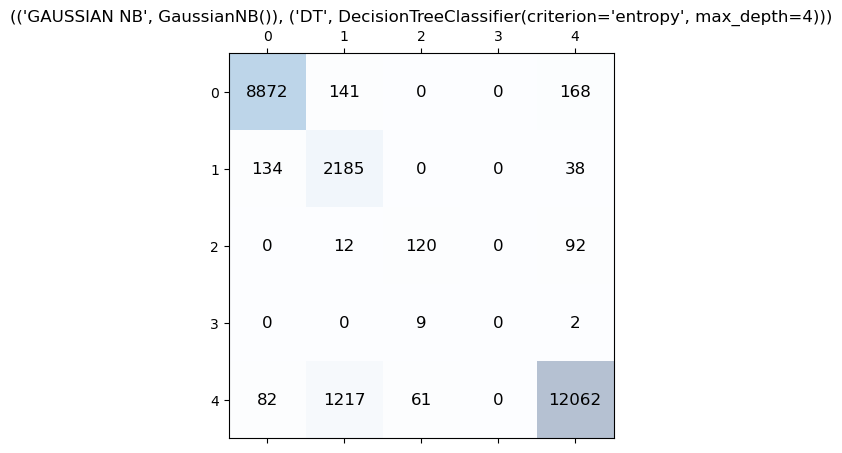

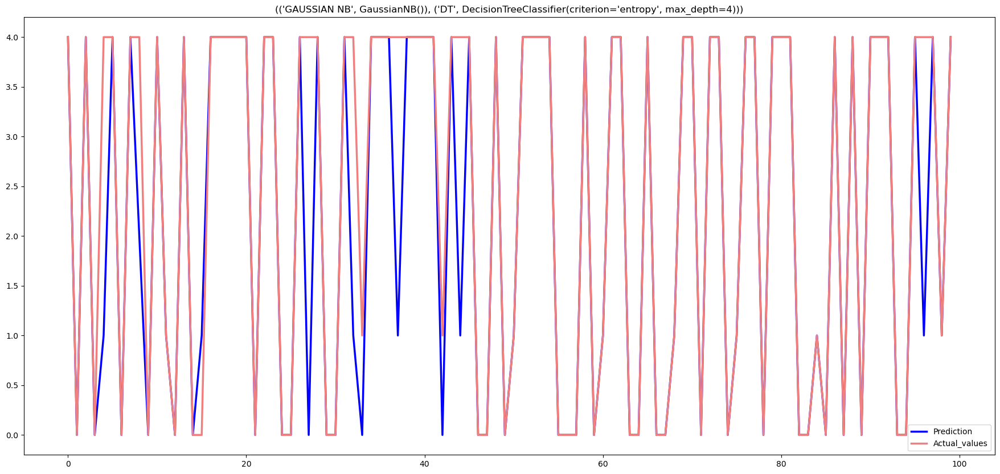



(('GAUSSIAN NB', GaussianNB()), ('RF', RandomForestClassifier(n_estimators=30)))
- Training time :  53.9199652671814
- Testing time :  0.3198883533477783
----------------------------------
- Train Accuracy : 0.9916350790847208
- Train MCC : 0.9854078334854994
- Train F1 score : 0.9914481342926965
- Train Precision : 0.9917023479348457
- Train Recall : 0.9916350790847208
- Train Cohens Kappa Score : 0.9853629415117597
- Train Log Loss : 0.026248811892723618
----------------------------------
Model performance for Test set
- Test Accuracy : 0.984441357412185
- Test MCC : 0.972932951437676
- Test F1 score : 0.9842182209393078
- Test Precision : 0.9840806469367793
- Test Recall : 0.984441357412185
- Test Cohens Kappa Score : 0.9728775902312706
- Test Log Loss : 0.05025302677575826
----------------------------------
Mean Absolute Error -  0.046159952371502284
Mean Squared Error -  0.15618178209962294
Root Mean Squared Error -  0.39519840852364646
----------------------------------


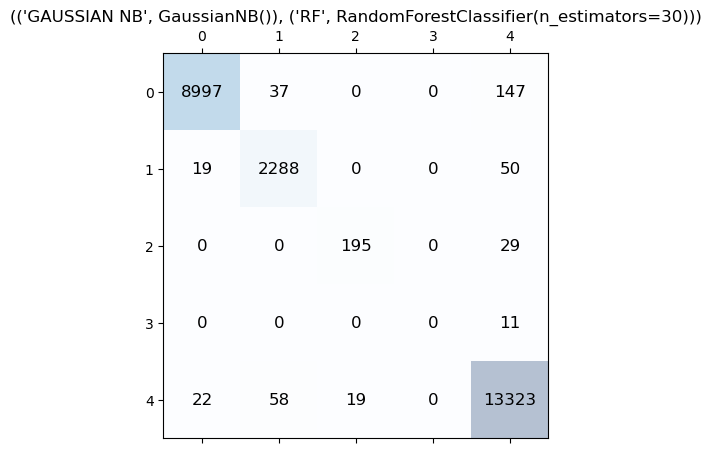

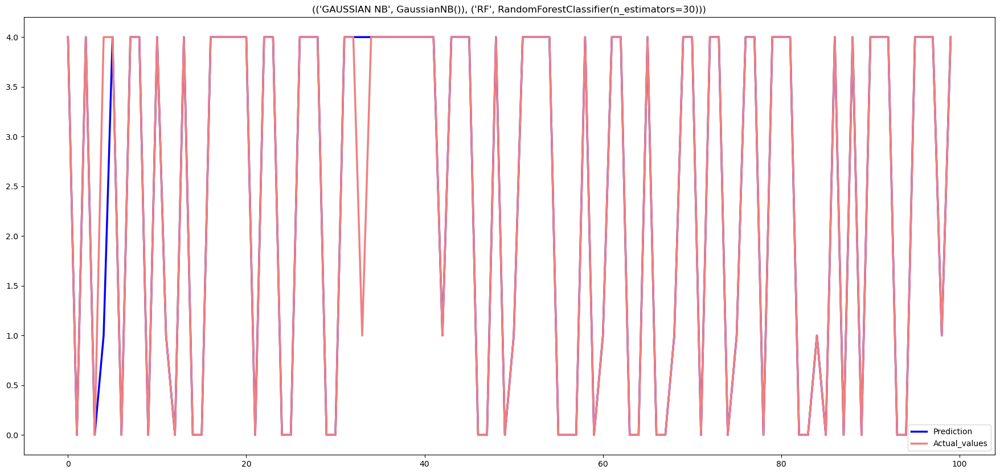



(('GAUSSIAN NB', GaussianNB()), ('LR', LogisticRegression(max_iter=1200000)))
- Training time :  254.9337785243988
- Testing time :  0.19203400611877441
----------------------------------
- Train Accuracy : 0.9647939034313044
- Train MCC : 0.9382689177861565
- Train F1 score : 0.9643396135901506
- Train Precision : 0.9642794087271479
- Train Recall : 0.9647939034313044
- Train Cohens Kappa Score : 0.9382295493433223
- Train Log Loss : 0.10693647701578066
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9622147251438777
- Test MCC : 0.9340443835606472
- Test F1 score : 0.9616534470072663
- Test Precision : 0.9612975461549367
- Test Recall : 0.9622147251438777
- Test Cohens Kappa Score : 0.9339959193863053
- Test Log Loss : 0.11924552098079381
----------------------------------
Mean Absolute Error -  0.09319309386783092
Mean Squared Error -  0.28561222464774755
Root Mean Squared Error -  0.5344270059117031
----------------------------------


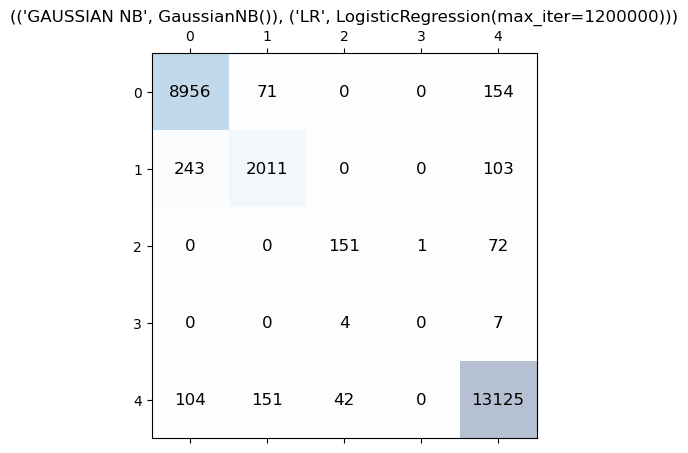

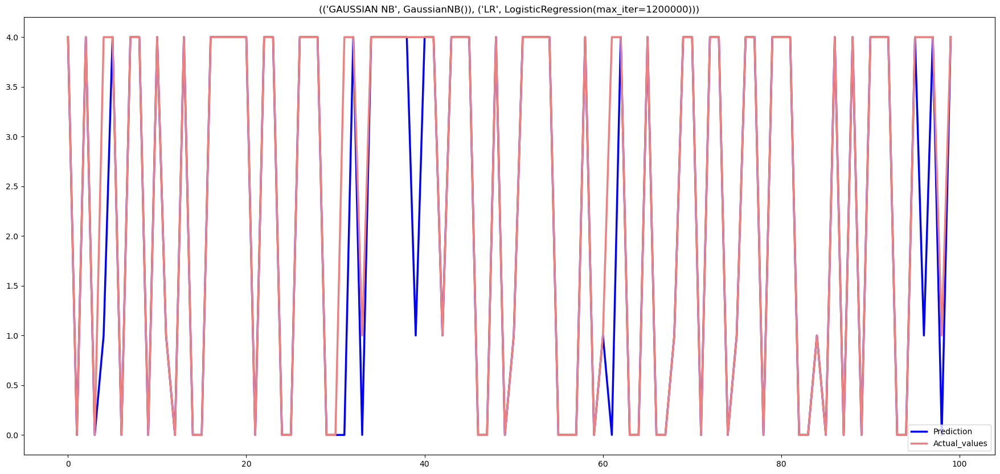



(('DT', DecisionTreeClassifier(criterion='entropy', max_depth=4)), ('RF', RandomForestClassifier(n_estimators=30)))
- Training time :  42.36286115646362
- Testing time :  0.1900348663330078
----------------------------------
- Train Accuracy : 0.9919129175018357
- Train MCC : 0.9858846248790194
- Train F1 score : 0.9918384259286253
- Train Precision : 0.9918661485845375
- Train Recall : 0.9919129175018357
- Train Cohens Kappa Score : 0.9858534602272448
- Train Log Loss : 0.0280268173964905
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9852351657074816
- Test MCC : 0.9742950734595436
- Test F1 score : 0.9851209747080177
- Test Precision : 0.9851163318792819
- Test Recall : 0.9852351657074816
- Test Cohens Kappa Score : 0.9742687645109067
- Test Log Loss : 0.04830261877019969
----------------------------------
Mean Absolute Error -  0.044532645366144076
Mean Squared Error -  0.15129986108354831
Root Mean Squared Error -  0.38897282820725193
-----

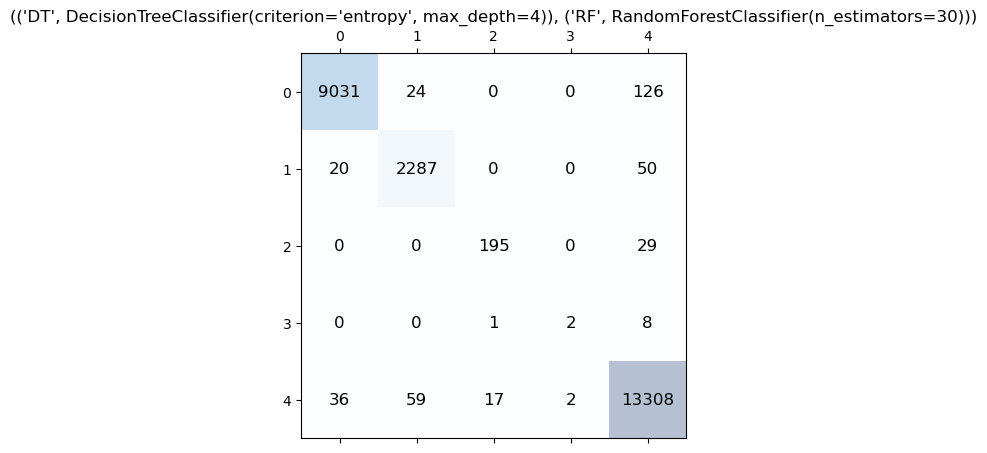

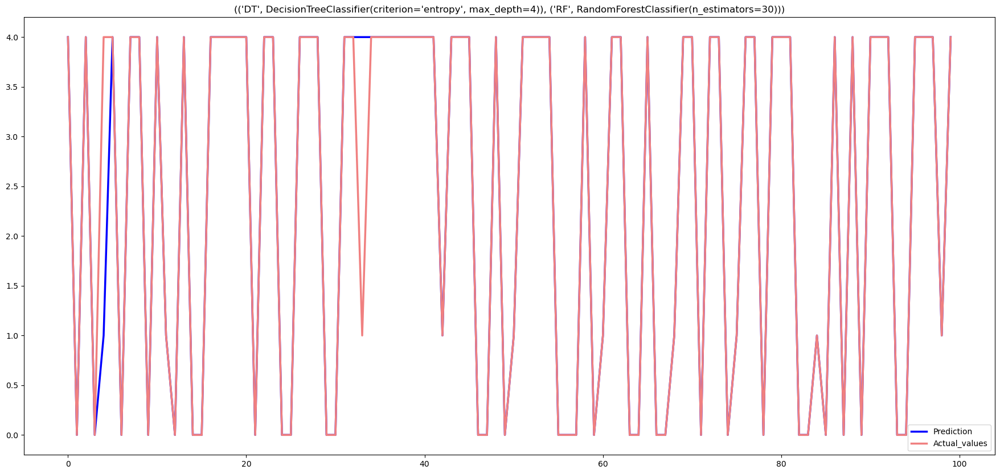



(('DT', DecisionTreeClassifier(criterion='entropy', max_depth=4)), ('LR', LogisticRegression(max_iter=1200000)))
- Training time :  288.7015874385834
- Testing time :  0.11151647567749023
----------------------------------
- Train Accuracy : 0.9729504455337474
- Train MCC : 0.9526107107345282
- Train F1 score : 0.9724697172021424
- Train Precision : 0.9725520427266469
- Train Recall : 0.9729504455337474
- Train Cohens Kappa Score : 0.9525479670159681
- Train Log Loss : 0.08762992221729263
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9715816630283787
- Test MCC : 0.9504395286009323
- Test F1 score : 0.9711158319082256
- Test Precision : 0.9708840840102669
- Test Recall : 0.9715816630283787
- Test Cohens Kappa Score : 0.9503947073711561
- Test Log Loss : 0.0962631057420391
----------------------------------
Mean Absolute Error -  0.07676126215518952
Mean Squared Error -  0.24242905338360785
Root Mean Squared Error -  0.4923708494454235
---------

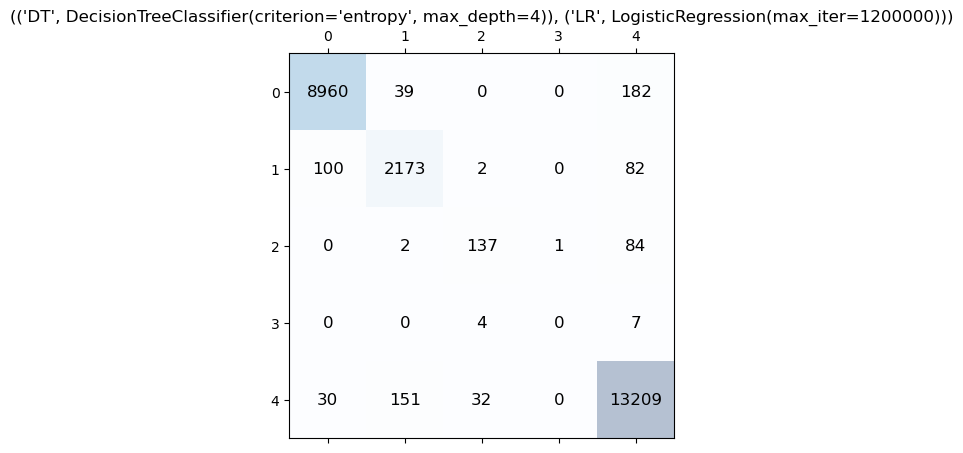

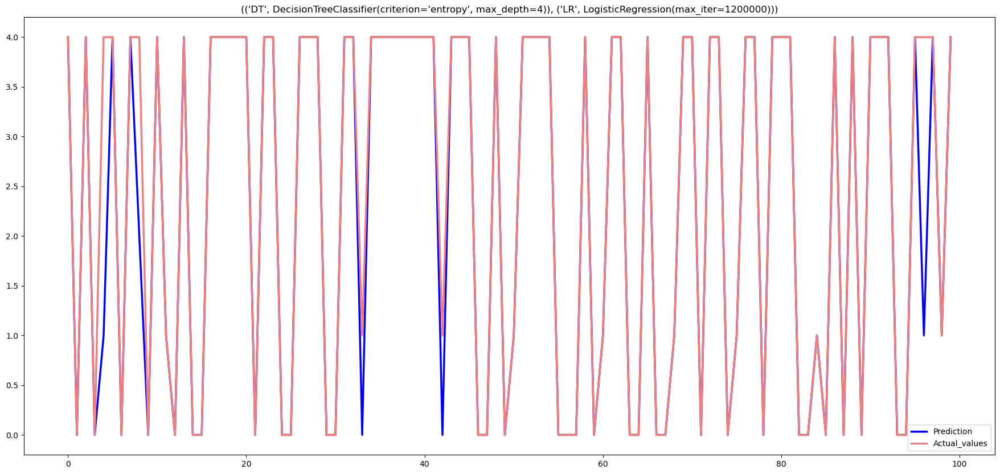



(('RF', RandomForestClassifier(n_estimators=30)), ('LR', LogisticRegression(max_iter=1200000)))
- Training time :  177.47811627388
- Testing time :  0.19902276992797852
----------------------------------
- Train Accuracy : 0.9916946158883884
- Train MCC : 0.9854810692784606
- Train F1 score : 0.9915188327402256
- Train Precision : 0.9917132399023001
- Train Recall : 0.9916946158883884
- Train Cohens Kappa Score : 0.9854652260837846
- Train Log Loss : 0.02709162383611538
----------------------------------
Model performance for Test set
- Test Accuracy : 0.985155784877952
- Test MCC : 0.9741347327120048
- Test F1 score : 0.9849212847703587
- Test Precision : 0.9847095723750805
- Test Recall : 0.985155784877952
- Test Cohens Kappa Score : 0.9741192505847183
- Test Log Loss : 0.04894047563238058
----------------------------------
Mean Absolute Error -  0.04528676324667593
Mean Squared Error -  0.15491168882714823
Root Mean Squared Error -  0.3935882224192541
-----------------------------

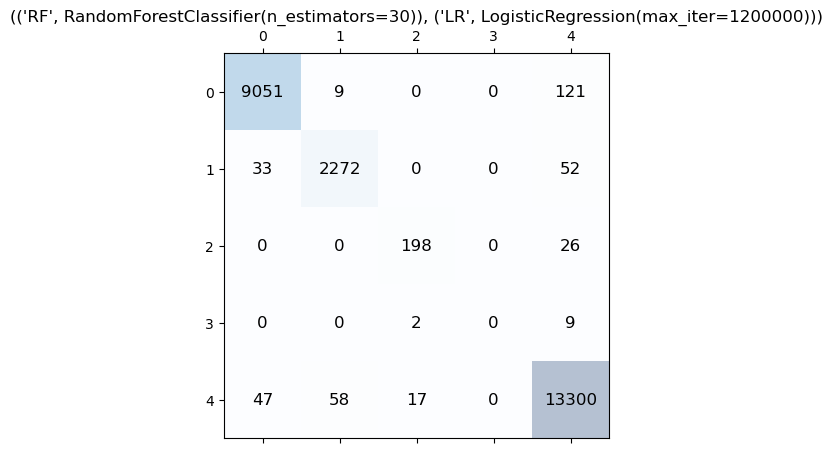

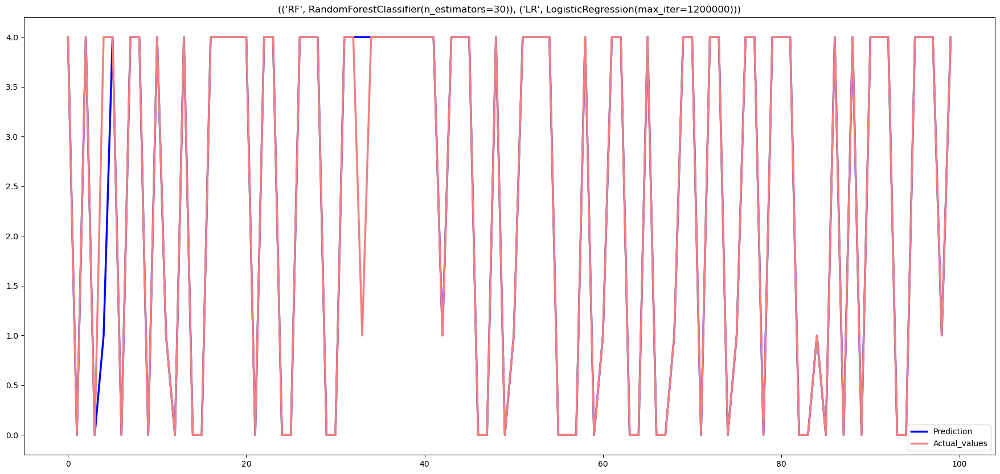



(('GAUSSIAN NB', GaussianNB()), ('DT', DecisionTreeClassifier(criterion='entropy', max_depth=4)), ('RF', RandomForestClassifier(n_estimators=30)))
- Training time :  41.36572790145874
- Testing time :  0.3284766674041748
----------------------------------
- Train Accuracy : 0.991843457897557
- Train MCC : 0.985757294183855
- Train F1 score : 0.9916677539611078
- Train Precision : 0.9918819717348286
- Train Recall : 0.991843457897557
- Train Cohens Kappa Score : 0.9857303744468998
- Train Log Loss : 0.027320853369021972
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9855923794403652
- Test MCC : 0.9749154430771881
- Test F1 score : 0.9853673711849521
- Test Precision : 0.985176354448513
- Test Recall : 0.9855923794403652
- Test Cohens Kappa Score : 0.9748952118776032
- Test Log Loss : 0.046603225682717395
----------------------------------
Mean Absolute Error -  0.04346100416749355
Mean Squared Error -  0.14760865251041874
Root Mean Squared Error

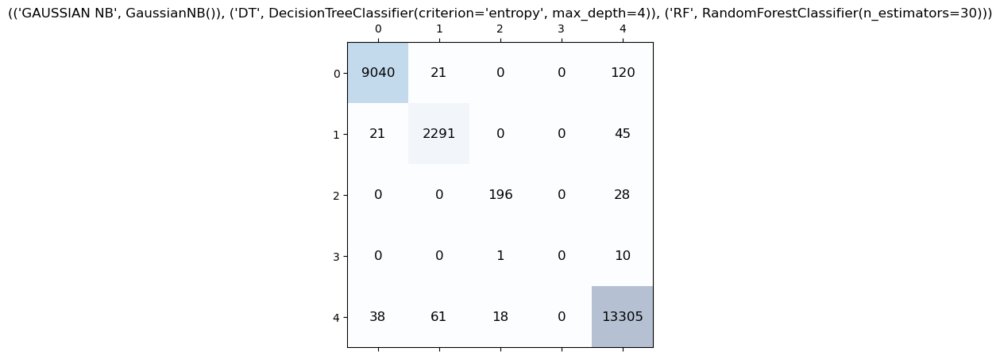

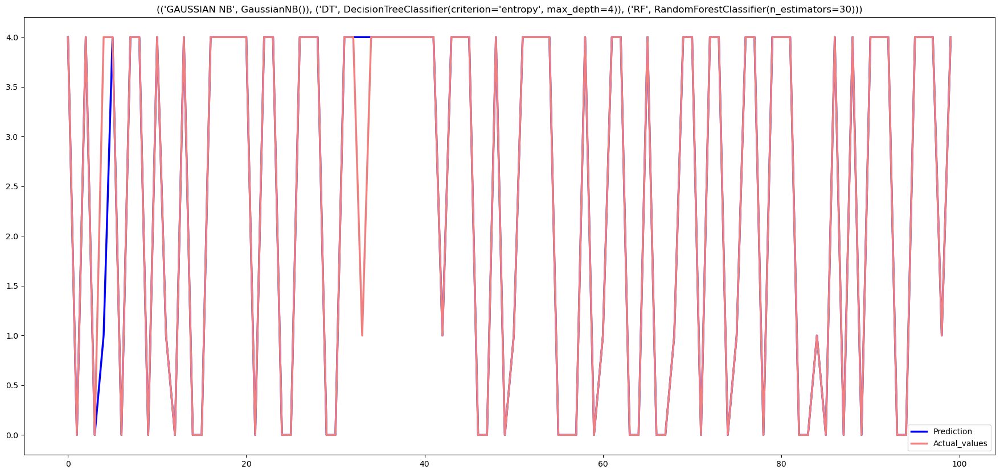



(('GAUSSIAN NB', GaussianNB()), ('DT', DecisionTreeClassifier(criterion='entropy', max_depth=4)), ('LR', LogisticRegression(max_iter=1200000)))
- Training time :  240.1570794582367
- Testing time :  0.20705795288085938
----------------------------------
- Train Accuracy : 0.9754708368890036
- Train MCC : 0.9570009631746214
- Train F1 score : 0.9751186561574489
- Train Precision : 0.9751400246767706
- Train Recall : 0.9754708368890036
- Train Cohens Kappa Score : 0.956967563175036
- Train Log Loss : 0.07781620237798399
----------------------------------
Model performance for Test set
- Test Accuracy : 0.974359992061917
- Test MCC : 0.9552642755332598
- Test F1 score : 0.9739792872309154
- Test Precision : 0.9736978949779804
- Test Recall : 0.974359992061917
- Test Cohens Kappa Score : 0.9552466104386786
- Test Log Loss : 0.08671627677797032
----------------------------------
Mean Absolute Error -  0.07017265330422703
Mean Squared Error -  0.22433022425084342
Root Mean Squared Error - 

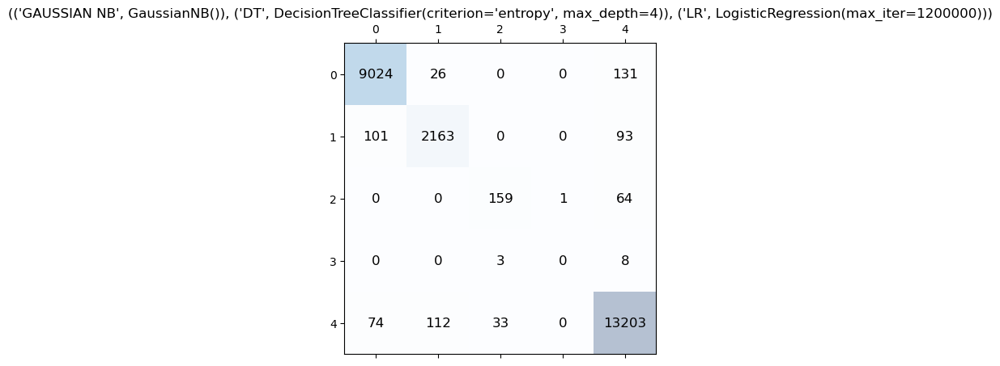

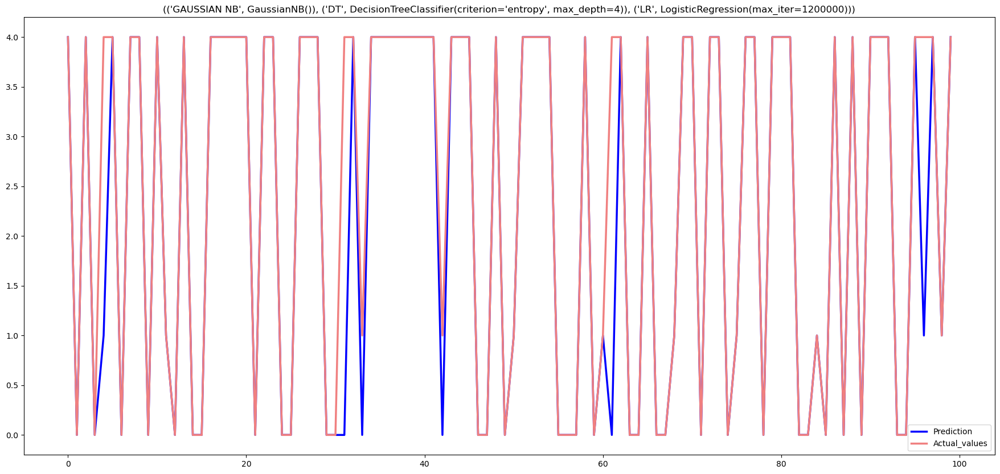



(('GAUSSIAN NB', GaussianNB()), ('RF', RandomForestClassifier(n_estimators=30)), ('LR', LogisticRegression(max_iter=1200000)))
- Training time :  197.28180074691772
- Testing time :  0.4163627624511719
----------------------------------
- Train Accuracy : 0.9914465458731072
- Train MCC : 0.9850644194769967
- Train F1 score : 0.9912605929241681
- Train Precision : 0.9914781415406497
- Train Recall : 0.9914465458731072
- Train Cohens Kappa Score : 0.9850325133057691
- Train Log Loss : 0.026374908400202787
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9844810478269498
- Test MCC : 0.9729886096615021
- Test F1 score : 0.9843145218519166
- Test Precision : 0.9845198260689402
- Test Recall : 0.9844810478269498
- Test Cohens Kappa Score : 0.9729648489892745
- Test Log Loss : 0.0487903566255167
----------------------------------
Mean Absolute Error -  0.04619964278626712
Mean Squared Error -  0.15574518753720976
Root Mean Squared Error -  0.39464564806

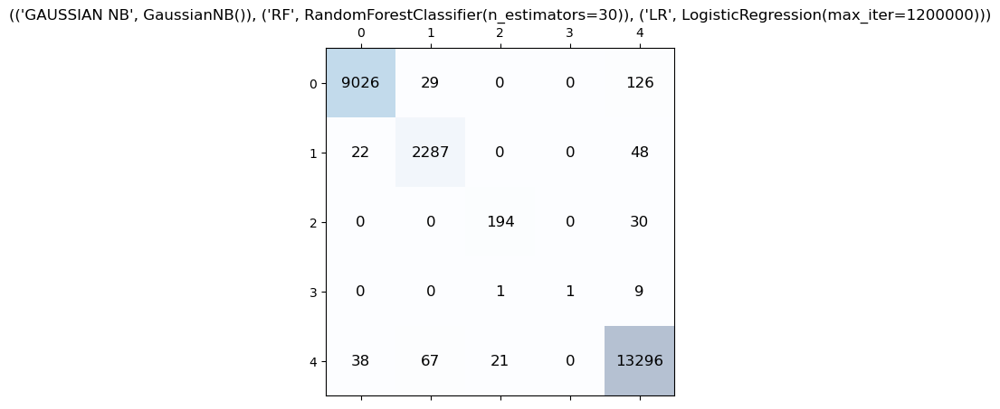

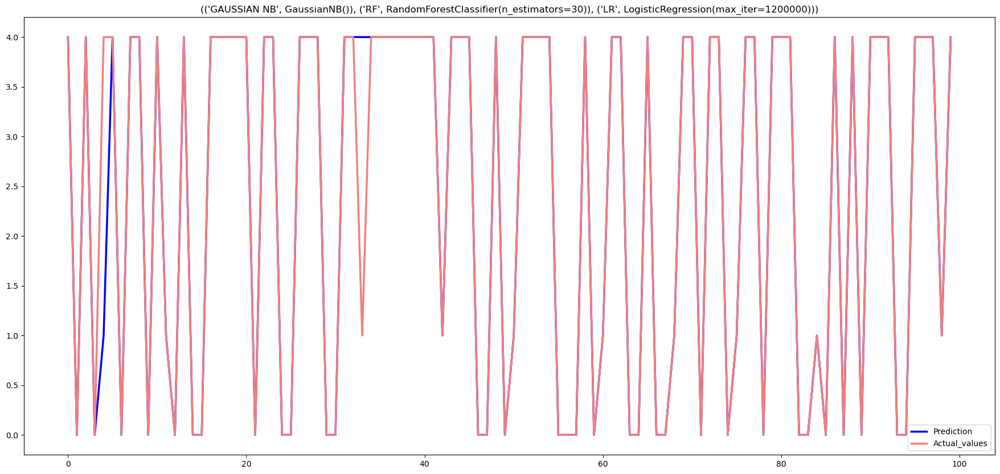



(('DT', DecisionTreeClassifier(criterion='entropy', max_depth=4)), ('RF', RandomForestClassifier(n_estimators=30)), ('LR', LogisticRegression(max_iter=1200000)))
- Training time :  183.0061469078064
- Testing time :  0.20221614837646484
----------------------------------
- Train Accuracy : 0.9917640754926671
- Train MCC : 0.985614719029772
- Train F1 score : 0.9916465867397426
- Train Precision : 0.991802097675872
- Train Recall : 0.9917640754926671
- Train Cohens Kappa Score : 0.9855882576133633
- Train Log Loss : 0.02679356294142461
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9852748561222465
- Test MCC : 0.9743590431771955
- Test F1 score : 0.9851082123949814
- Test Precision : 0.9853032142636022
- Test Recall : 0.9852748561222465
- Test Cohens Kappa Score : 0.9743347943390385
- Test Log Loss : 0.047759676430409966
----------------------------------
Mean Absolute Error -  0.04492954951379242
Mean Squared Error -  0.15344314348084936
Root M

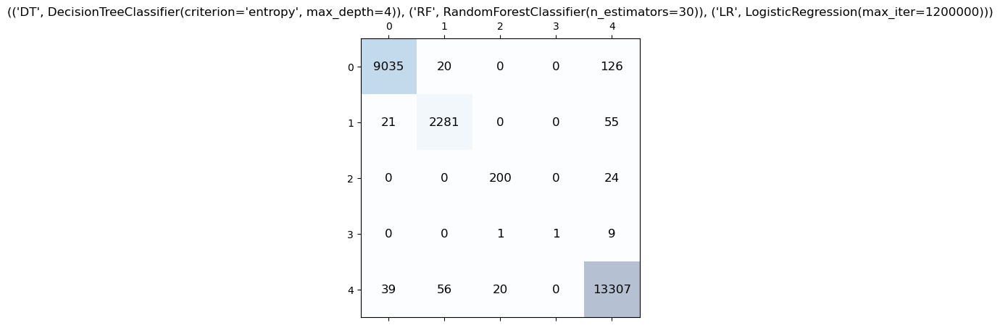

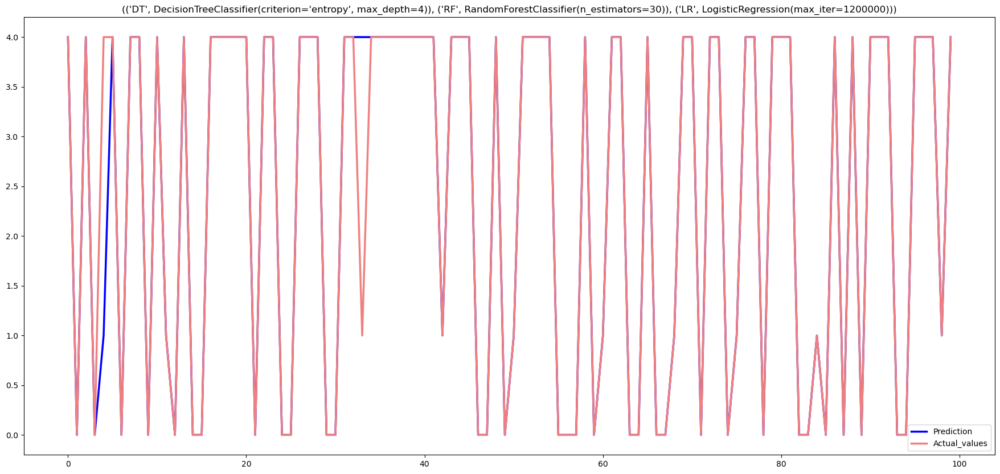



(('GAUSSIAN NB', GaussianNB()), ('DT', DecisionTreeClassifier(criterion='entropy', max_depth=4)), ('RF', RandomForestClassifier(n_estimators=30)), ('LR', LogisticRegression(max_iter=1200000)))
- Training time :  192.7491590976715
- Testing time :  0.3457033634185791
----------------------------------
- Train Accuracy : 0.9915556966798309
- Train MCC : 0.9852451776009493
- Train F1 score : 0.9914656111221994
- Train Precision : 0.9915623419654799
- Train Recall : 0.9915556966798309
- Train Cohens Kappa Score : 0.9852405613779608
- Train Log Loss : 0.027122727929622035
----------------------------------
Model performance for Test set
- Test Accuracy : 0.985155784877952
- Test MCC : 0.9741715307637451
- Test F1 score : 0.9849941953712886
- Test Precision : 0.9851966685835618
- Test Recall : 0.985155784877952
- Test Cohens Kappa Score : 0.9741603295864436
- Test Log Loss : 0.04812007086462284
----------------------------------
Mean Absolute Error -  0.04485016868426275
Mean Squared Error

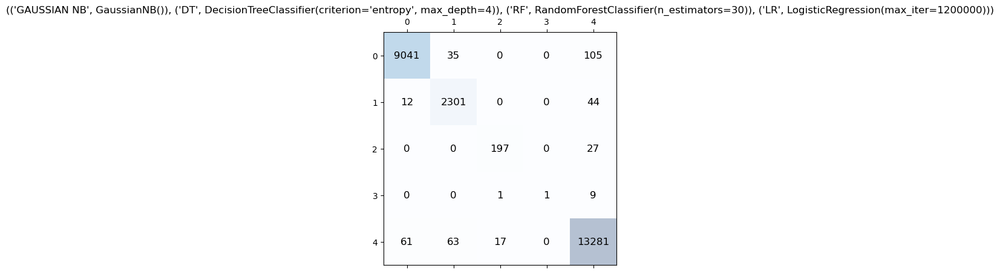

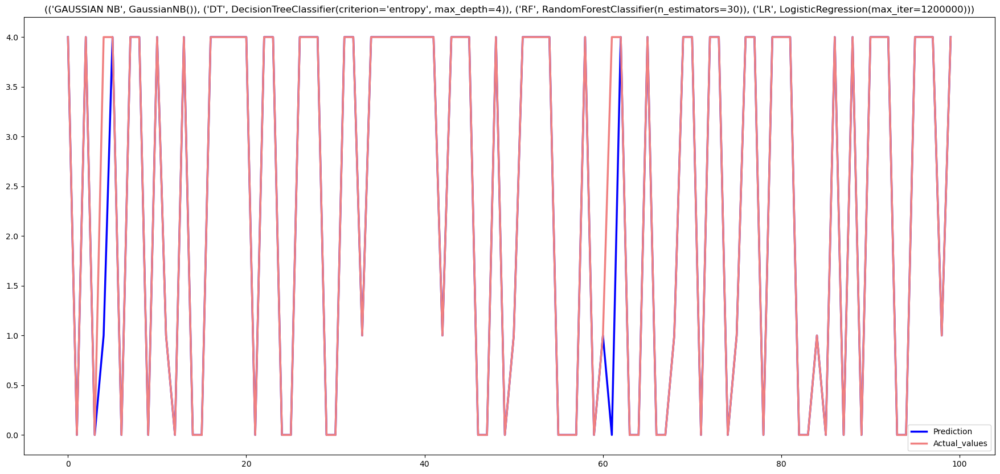

In [37]:
from itertools import combinations,product
algo_list = [
    ('GAUSSIAN NB',nb),
    ('DT',dt),
    ('RF',rf),
    ('LR',lr)
    ]
list_combo = []
for n in range(len(algo_list) + 1):
    list_combo += combinations(algo_list, n)
res = list_combo[5:len(list_combo)]
for i in res:
    print('\n')
    print(i)
    stack_model = StackingClassifier(estimators=i, final_estimator=MLPClassifier())
    start_time = time.time()
    stack_model.fit(X_train, Y_train)
    end_time = time.time()
    print("- Training time : ",end_time-start_time)
    start_time = time.time()
    Y_test_predf1 = stack_model.predict(X_test)
    end_time = time.time()
    print("- Testing time : ",end_time-start_time)
    print('----------------------------------')
    Y_train_predf1 = stack_model.predict(X_train)
    Y_train_probsf1 = stack_model.predict_proba(X_train)
    Y_test_probsf1 = stack_model.predict_proba(X_test)

    # Training set model performance
    stack_model_train_accuracy = accuracy_score(Y_train, Y_train_predf1)
    stack_model_train_mcc = matthews_corrcoef(Y_train, Y_train_predf1)
    stack_model_train_f1 = f1_score(Y_train, Y_train_predf1, average='weighted') 
    stack_model_train_precision = precision_score(Y_train, Y_train_predf1,average='weighted')
    stack_model_train_recall = recall_score(Y_train, Y_train_predf1, average='weighted')
    stack_model_train_ckscore = cohen_kappa_score(Y_train, Y_train_predf1)
    stack_model_train_logloss = log_loss(Y_train, Y_train_probsf1)

    # Test set model performance
    stack_model_test_accuracy = accuracy_score(Y_test, Y_test_predf1) 
    stack_model_test_mcc = matthews_corrcoef(Y_test, Y_test_predf1)
    stack_model_test_f1 = f1_score(Y_test, Y_test_predf1, average='weighted')
    stack_model_test_precision = precision_score(Y_test, Y_test_predf1,average='weighted')
    stack_model_test_recall = recall_score(Y_test, Y_test_predf1, average='weighted')
    stack_model_test_ckscore = cohen_kappa_score(Y_test, Y_test_predf1)
    stack_model_test_logloss = log_loss(Y_test, Y_test_probsf1)

    print('- Train Accuracy : %s' % stack_model_train_accuracy)
    print('- Train MCC : %s' % stack_model_train_mcc)
    print('- Train F1 score : %s' % stack_model_train_f1)
    print('- Train Precision : %s' % stack_model_train_precision)
    print('- Train Recall : %s' % stack_model_train_recall)
    print('- Train Cohens Kappa Score : %s' % stack_model_train_ckscore)
    print('- Train Log Loss : %s' % stack_model_train_logloss)
    print('----------------------------------')
    print('Model performance for Test set')
    print('- Test Accuracy : %s' % stack_model_test_accuracy)
    print('- Test MCC : %s' % stack_model_test_mcc)
    print('- Test F1 score : %s' % stack_model_test_f1)
    print('- Test Precision : %s' % stack_model_test_precision)
    print('- Test Recall : %s' % stack_model_test_recall)
    print('- Test Cohens Kappa Score : %s' % stack_model_test_ckscore)
    print('- Test Log Loss : %s' % stack_model_test_logloss)
    print('----------------------------------')
    print("Mean Absolute Error - " , metrics.mean_absolute_error(Y_test, Y_test_predf1))
    print("Mean Squared Error - " , metrics.mean_squared_error(Y_test, Y_test_predf1))
    print("Root Mean Squared Error - " , np.sqrt(metrics.mean_squared_error(Y_test, Y_test_predf1)))
    print('----------------------------------')
    matrix(Y_test, Y_test_predf1, i)
    plot(Y_test, Y_test_predf1, i)



(('KNN', KNeighborsClassifier()), ('GAUSSIAN NB', GaussianNB()))
- Training time :  197.1456756591797
- Testing time :  56.240602016448975
----------------------------------
- Train Accuracy : 0.9864156859632063
- Train MCC : 0.9762871232831188
- Train F1 score : 0.9862160073884992
- Train Precision : 0.986117767572997
- Train Recall : 0.9864156859632063
- Train Cohens Kappa Score : 0.9762088569749118
- Train Log Loss : 0.03864798018357461
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9836078587021234
- Test MCC : 0.9714808398143874
- Test F1 score : 0.9833884122249342
- Test Precision : 0.9832584907030808
- Test Recall : 0.9836078587021234
- Test Cohens Kappa Score : 0.9714182662097055
- Test Log Loss : 0.060387827499591755
----------------------------------
Mean Absolute Error -  0.0482635443540385
Mean Squared Error -  0.16336574717205796
Root Mean Squared Error -  0.40418528816875304
----------------------------------


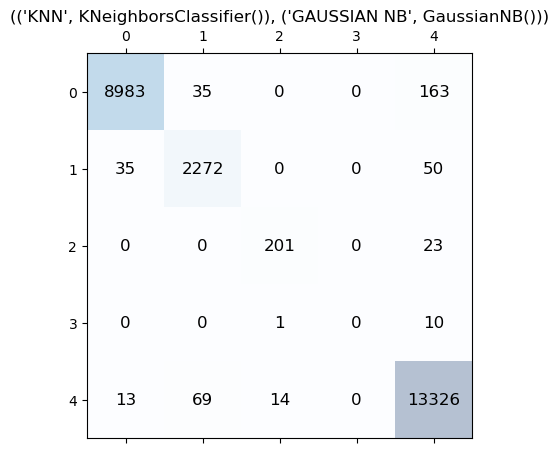

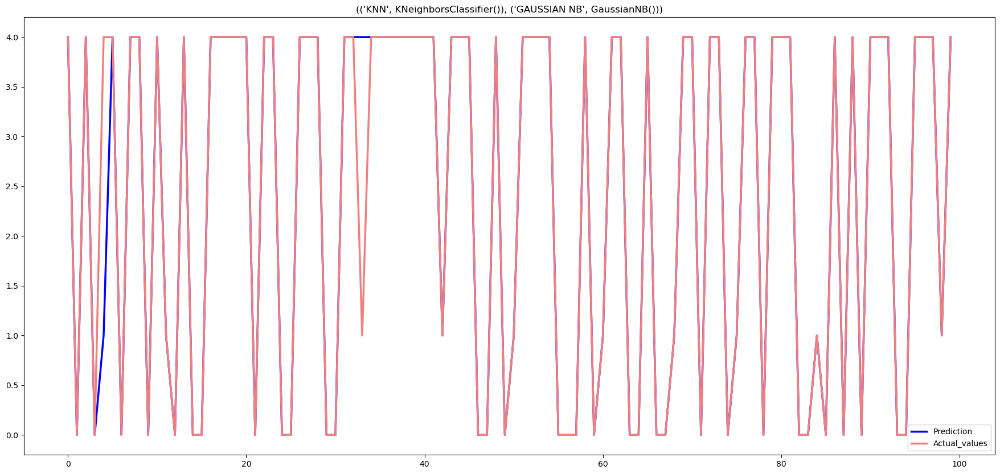



(('KNN', KNeighborsClassifier()), ('DT', DecisionTreeClassifier(criterion='entropy', max_depth=4)))
- Training time :  201.8162648677826
- Testing time :  56.4409658908844
----------------------------------
- Train Accuracy : 0.9872095100121058
- Train MCC : 0.9776645616095564
- Train F1 score : 0.9870166650290653
- Train Precision : 0.9869021514337405
- Train Recall : 0.9872095100121058
- Train Cohens Kappa Score : 0.9776037822404363
- Train Log Loss : 0.037125079850737666
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9845604286564794
- Test MCC : 0.9731275078683603
- Test F1 score : 0.9843372837091906
- Test Precision : 0.9841802233268523
- Test Recall : 0.9845604286564794
- Test Cohens Kappa Score : 0.9730822765640657
- Test Log Loss : 0.05542507472957545
----------------------------------
Mean Absolute Error -  0.04592180988291328
Mean Squared Error -  0.15546735463385591
Root Mean Squared Error -  0.3942934879424918
-----------------------

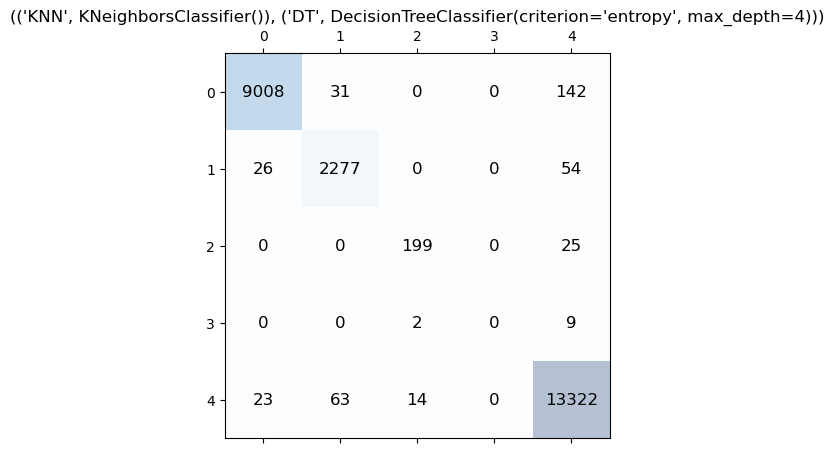

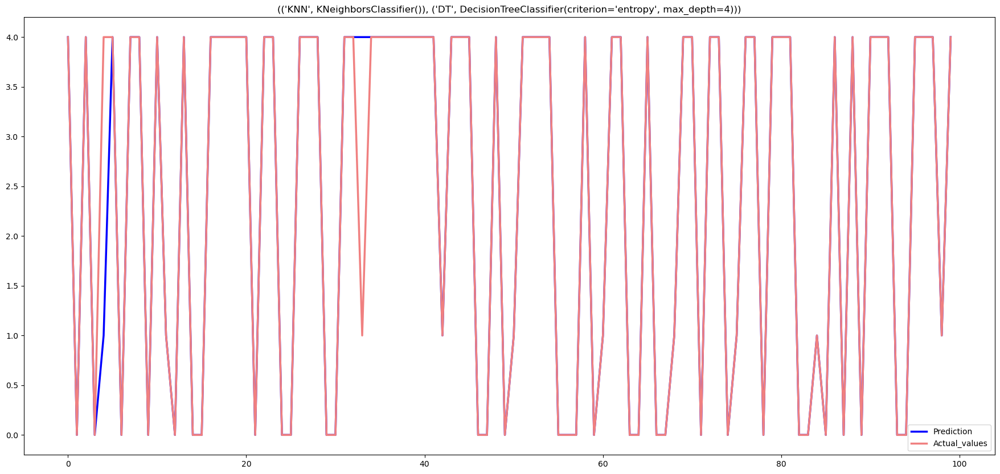



(('KNN', KNeighborsClassifier()), ('RF', RandomForestClassifier(n_estimators=30)))
- Training time :  242.68939805030823
- Testing time :  71.4092664718628
----------------------------------
- Train Accuracy : 0.9903153466034254
- Train MCC : 0.9831143746921968
- Train F1 score : 0.9902330566733897
- Train Precision : 0.9902992461083863
- Train Recall : 0.9903153466034254
- Train Cohens Kappa Score : 0.9830611982114252
- Train Log Loss : 0.028701727182100647
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9854733081960706
- Test MCC : 0.9747508119421231
- Test F1 score : 0.9853850766869413
- Test Precision : 0.9854536881364072
- Test Recall : 0.9854733081960706
- Test Cohens Kappa Score : 0.9746971206206979
- Test Log Loss : 0.04885688231516707
----------------------------------
Mean Absolute Error -  0.04381821790037706
Mean Squared Error -  0.1495534828338956
Root Mean Squared Error -  0.38672145380608974
----------------------------------


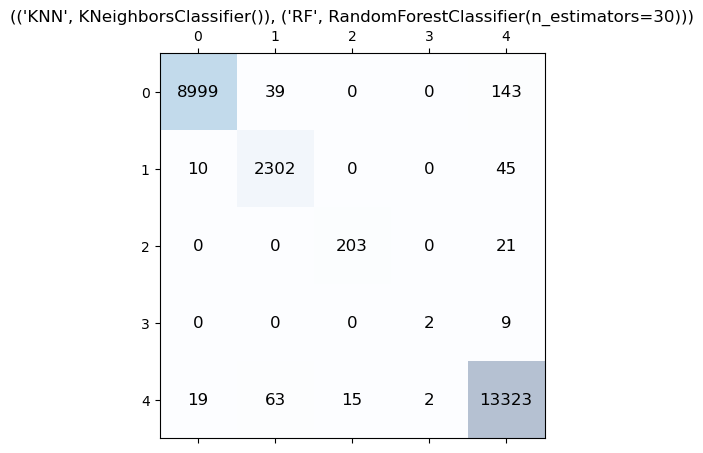

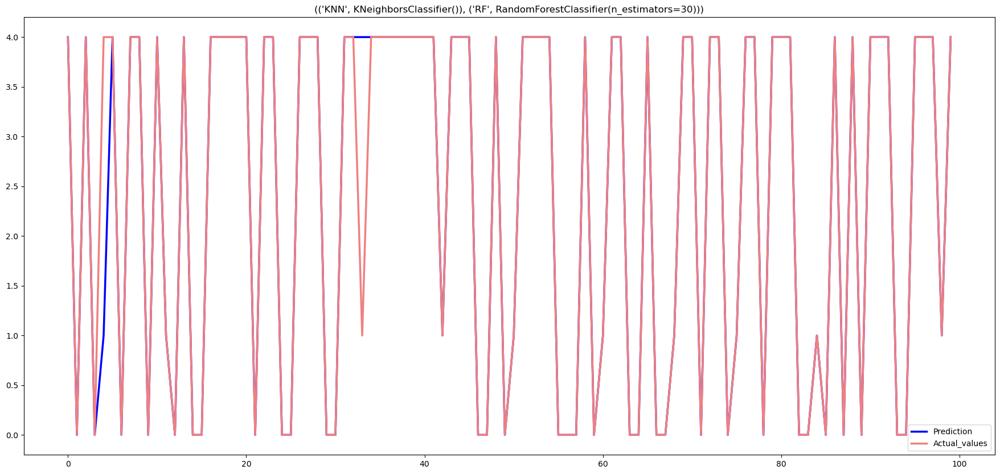



(('KNN', KNeighborsClassifier()), ('LR', LogisticRegression(max_iter=1200000)))
- Training time :  388.63551020622253
- Testing time :  77.30158972740173
----------------------------------
- Train Accuracy : 0.9868622119907122
- Train MCC : 0.977063426709385
- Train F1 score : 0.9868139654439585
- Train Precision : 0.986909965395742
- Train Recall : 0.9868622119907122
- Train Cohens Kappa Score : 0.97702328381895
- Train Log Loss : 0.03812733151242511
----------------------------------
Model performance for Test set
- Test Accuracy : 0.983449097043064
- Test MCC : 0.9712232639148157
- Test F1 score : 0.9833688260852321
- Test Precision : 0.983424617396585
- Test Recall : 0.983449097043064
- Test Cohens Kappa Score : 0.971189507292933
- Test Log Loss : 0.05692374823962482
----------------------------------
Mean Absolute Error -  0.047469736058741815
Mean Squared Error -  0.15725342329827346
Root Mean Squared Error -  0.39655191753195884
----------------------------------


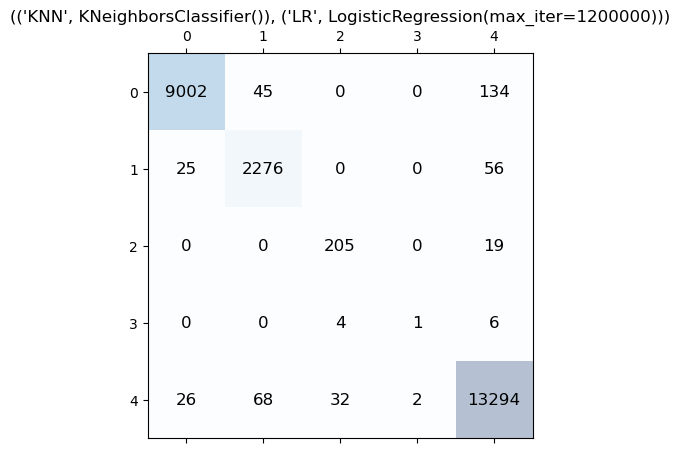

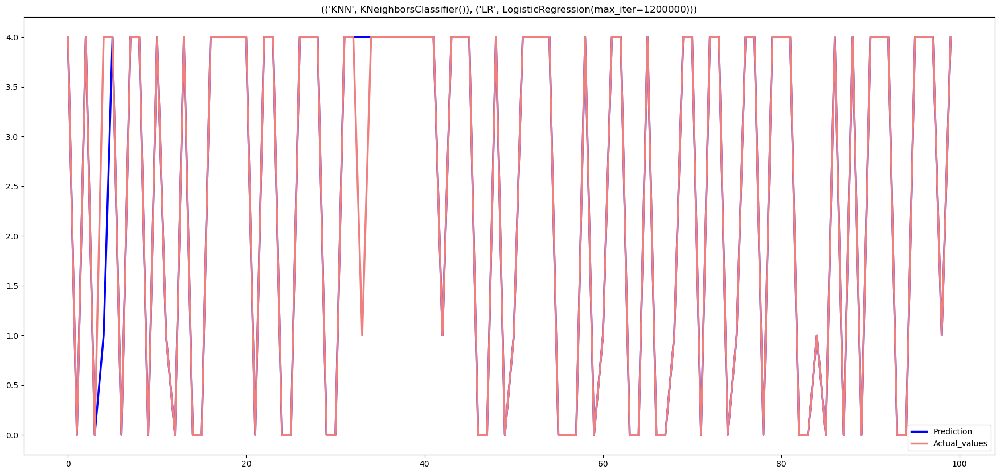



(('KNN', KNeighborsClassifier()), ('GAUSSIAN NB', GaussianNB()), ('DT', DecisionTreeClassifier(criterion='entropy', max_depth=4)), ('RF', RandomForestClassifier(n_estimators=30)))
- Training time :  303.72721672058105
- Testing time :  80.0216314792633
----------------------------------
- Train Accuracy : 0.9909107146401
- Train MCC : 0.9841405740454969
- Train F1 score : 0.9908319067098362
- Train Precision : 0.9908743929067183
- Train Recall : 0.9909107146401
- Train Cohens Kappa Score : 0.9840986807174422
- Train Log Loss : 0.029122468719660174
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9857511410994245
- Test MCC : 0.9752162216413836
- Test F1 score : 0.9856898970187856
- Test Precision : 0.9857229597100116
- Test Recall : 0.9857511410994245
- Test Cohens Kappa Score : 0.9751753498281868
- Test Log Loss : 0.046347166042839526
----------------------------------
Mean Absolute Error -  0.0429450287755507
Mean Squared Error -  0.146695772970

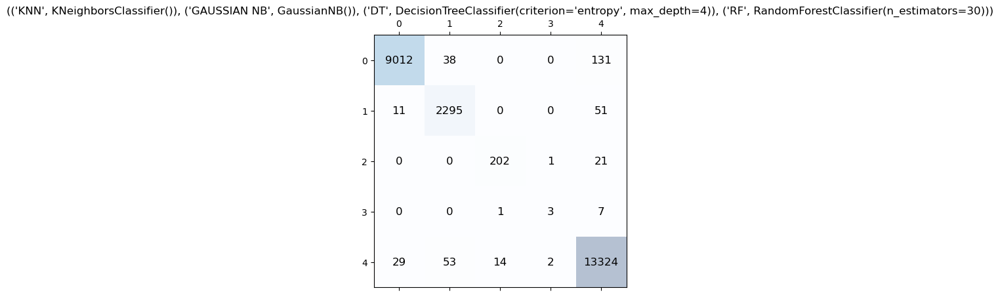

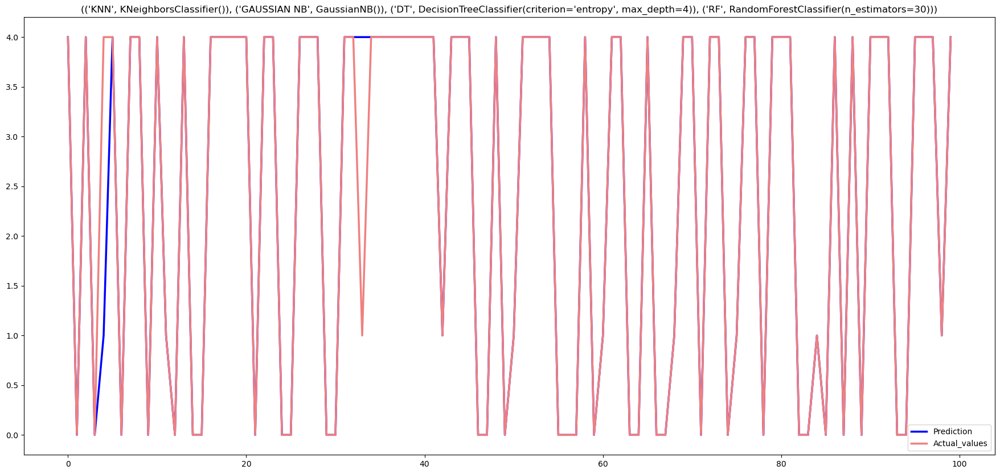



(('KNN', KNeighborsClassifier()), ('GAUSSIAN NB', GaussianNB()), ('DT', DecisionTreeClassifier(criterion='entropy', max_depth=4)), ('LR', LogisticRegression(max_iter=1200000)))
- Training time :  552.8801000118256
- Testing time :  80.40289521217346
----------------------------------
- Train Accuracy : 0.9875766536347219
- Train MCC : 0.9783036256517733
- Train F1 score : 0.9874713856154579
- Train Precision : 0.987496075443166
- Train Recall : 0.9875766536347219
- Train Cohens Kappa Score : 0.9782648074091829
- Train Log Loss : 0.03753611984880303
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9842825957531256
- Test MCC : 0.9726701739504716
- Test F1 score : 0.9841612530631878
- Test Precision : 0.9841822070777599
- Test Recall : 0.9842825957531256
- Test Cohens Kappa Score : 0.9726309660116434
- Test Log Loss : 0.05371243295024237
----------------------------------
Mean Absolute Error -  0.0467553085929748
Mean Squared Error -  0.158285374082

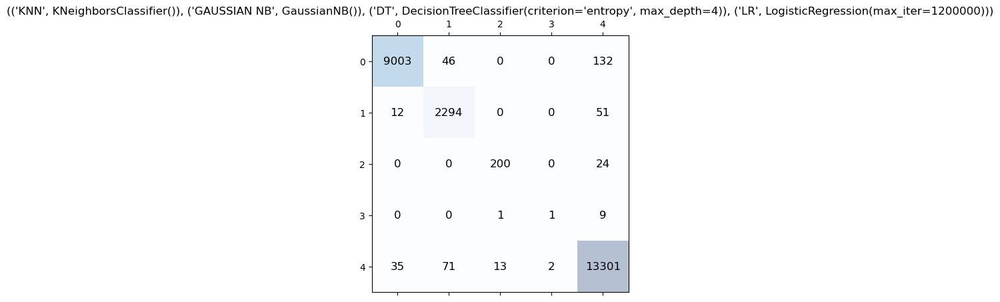

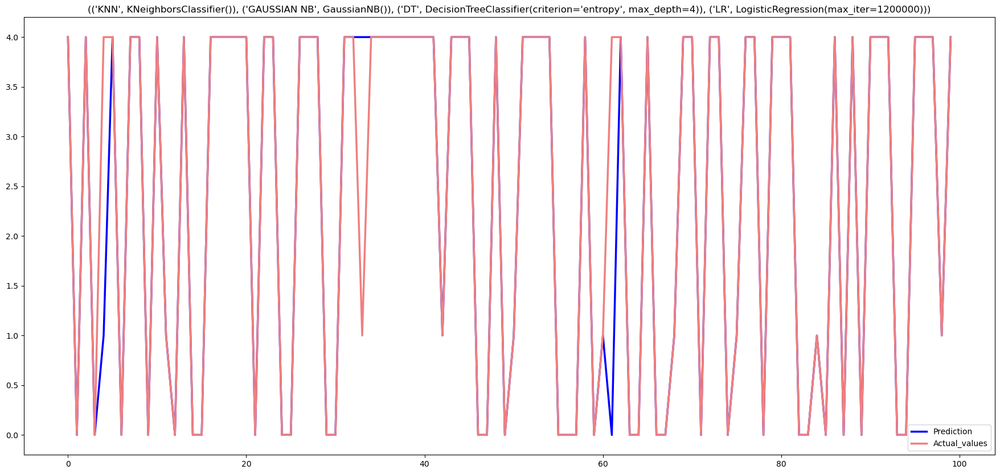



(('KNN', KNeighborsClassifier()), ('GAUSSIAN NB', GaussianNB()), ('RF', RandomForestClassifier(n_estimators=30)), ('LR', LogisticRegression(max_iter=1200000)))
- Training time :  453.2328414916992
- Testing time :  58.24643588066101
----------------------------------
- Train Accuracy : 0.9912083986584374
- Train MCC : 0.9846309211160329
- Train F1 score : 0.9911173386467288
- Train Precision : 0.9911075042196844
- Train Recall : 0.9912083986584374
- Train Cohens Kappa Score : 0.9846171821887781
- Train Log Loss : 0.02958137334694945
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9858305219289542
- Test MCC : 0.9753216039853836
- Test F1 score : 0.985728698280171
- Test Precision : 0.9856867660545168
- Test Recall : 0.9858305219289542
- Test Cohens Kappa Score : 0.9753084292430998
- Test Log Loss : 0.04806452308305082
----------------------------------
Mean Absolute Error -  0.04389759872990673
Mean Squared Error -  0.15233181186743402
Root Mean 

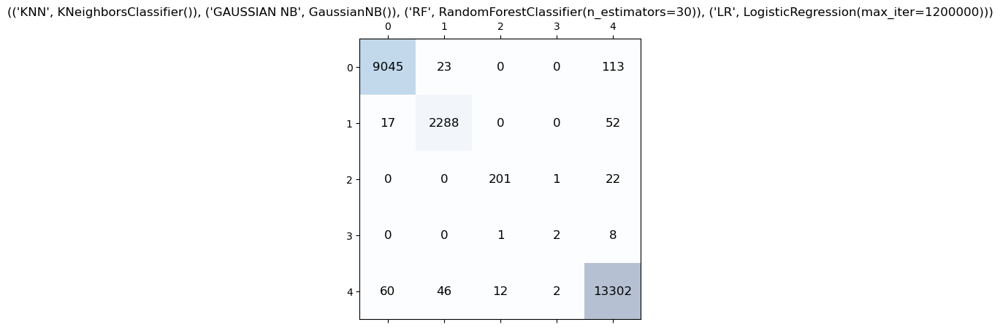

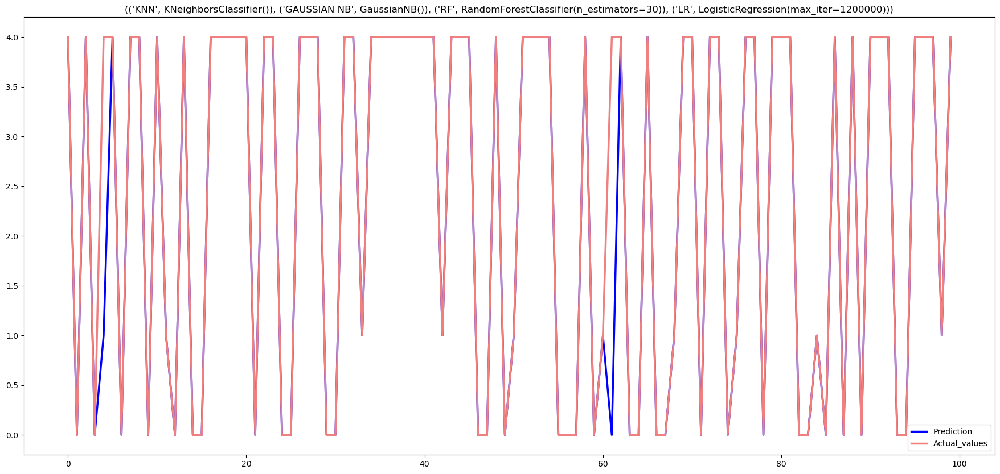



(('KNN', KNeighborsClassifier()), ('DT', DecisionTreeClassifier(criterion='entropy', max_depth=4)), ('RF', RandomForestClassifier(n_estimators=30)), ('LR', LogisticRegression(max_iter=1200000)))
- Training time :  398.65767645835876
- Testing time :  58.33432698249817
----------------------------------
- Train Accuracy : 0.9903153466034254
- Train MCC : 0.983078498138417
- Train F1 score : 0.990212651904103
- Train Precision : 0.9902161323870531
- Train Recall : 0.9903153466034254
- Train Cohens Kappa Score : 0.9830488901613008
- Train Log Loss : 0.0284703494291835
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9859495931732487
- Test MCC : 0.9755418590938592
- Test F1 score : 0.9858239886646519
- Test Precision : 0.9858367076983701
- Test Recall : 0.9859495931732487
- Test Cohens Kappa Score : 0.9755071660974228
- Test Log Loss : 0.04691903605689197
----------------------------------
Mean Absolute Error -  0.0427068862869617
Mean Squared Error 

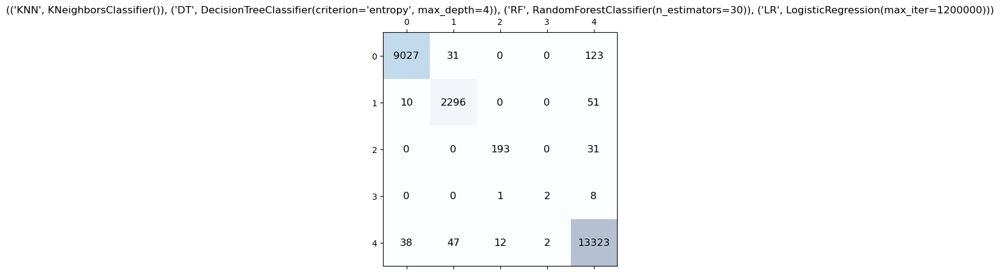

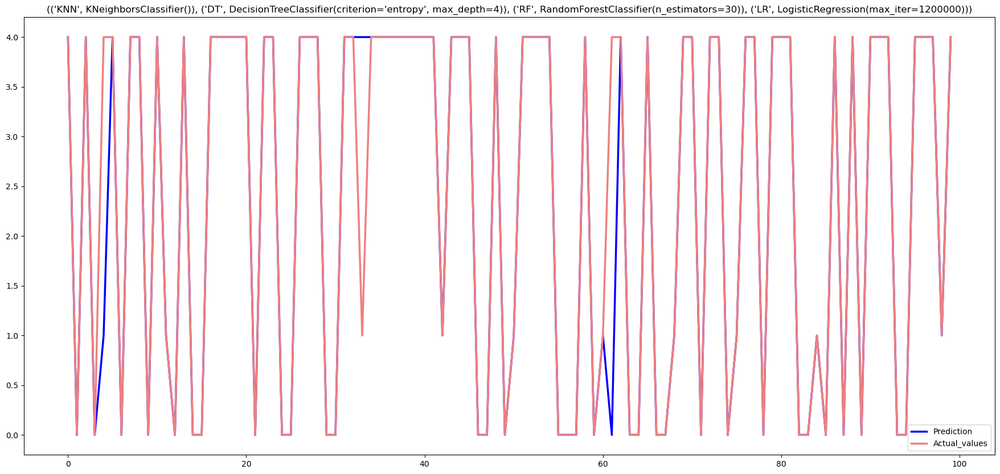

In [38]:
from itertools import combinations,product
algo_list = [
    ('KNN',knn),
    ('GAUSSIAN NB',nb),
    ('DT',dt),
    ('RF',rf),
    ('LR',lr)
    ]
list_combo = []
for n in range(len(algo_list) + 1):
    list_combo += combinations(algo_list, n)
res = list_combo[6:10]+list_combo[26:30]
for i in res:
    print('\n')
    print(i)
    stack_model = StackingClassifier(estimators=i, final_estimator=MLPClassifier())
    start_time = time.time()
    stack_model.fit(X_train, Y_train)
    end_time = time.time()
    print("- Training time : ",end_time-start_time)
    start_time = time.time()
    Y_test_predf1 = stack_model.predict(X_test)
    end_time = time.time()
    print("- Testing time : ",end_time-start_time)
    print('----------------------------------')
    Y_train_predf1 = stack_model.predict(X_train)
    Y_train_probsf1 = stack_model.predict_proba(X_train)
    Y_test_probsf1 = stack_model.predict_proba(X_test)

    # Training set model performance
    stack_model_train_accuracy = accuracy_score(Y_train, Y_train_predf1)
    stack_model_train_mcc = matthews_corrcoef(Y_train, Y_train_predf1)
    stack_model_train_f1 = f1_score(Y_train, Y_train_predf1, average='weighted') 
    stack_model_train_precision = precision_score(Y_train, Y_train_predf1,average='weighted')
    stack_model_train_recall = recall_score(Y_train, Y_train_predf1, average='weighted')
    stack_model_train_ckscore = cohen_kappa_score(Y_train, Y_train_predf1)
    stack_model_train_logloss = log_loss(Y_train, Y_train_probsf1)

    # Test set model performance
    stack_model_test_accuracy = accuracy_score(Y_test, Y_test_predf1) 
    stack_model_test_mcc = matthews_corrcoef(Y_test, Y_test_predf1)
    stack_model_test_f1 = f1_score(Y_test, Y_test_predf1, average='weighted')
    stack_model_test_precision = precision_score(Y_test, Y_test_predf1,average='weighted')
    stack_model_test_recall = recall_score(Y_test, Y_test_predf1, average='weighted')
    stack_model_test_ckscore = cohen_kappa_score(Y_test, Y_test_predf1)
    stack_model_test_logloss = log_loss(Y_test, Y_test_probsf1)

    print('- Train Accuracy : %s' % stack_model_train_accuracy)
    print('- Train MCC : %s' % stack_model_train_mcc)
    print('- Train F1 score : %s' % stack_model_train_f1)
    print('- Train Precision : %s' % stack_model_train_precision)
    print('- Train Recall : %s' % stack_model_train_recall)
    print('- Train Cohens Kappa Score : %s' % stack_model_train_ckscore)
    print('- Train Log Loss : %s' % stack_model_train_logloss)
    print('----------------------------------')
    print('Model performance for Test set')
    print('- Test Accuracy : %s' % stack_model_test_accuracy)
    print('- Test MCC : %s' % stack_model_test_mcc)
    print('- Test F1 score : %s' % stack_model_test_f1)
    print('- Test Precision : %s' % stack_model_test_precision)
    print('- Test Recall : %s' % stack_model_test_recall)
    print('- Test Cohens Kappa Score : %s' % stack_model_test_ckscore)
    print('- Test Log Loss : %s' % stack_model_test_logloss)
    print('----------------------------------')
    print("Mean Absolute Error - " , metrics.mean_absolute_error(Y_test, Y_test_predf1))
    print("Mean Squared Error - " , metrics.mean_squared_error(Y_test, Y_test_predf1))
    print("Root Mean Squared Error - " , np.sqrt(metrics.mean_squared_error(Y_test, Y_test_predf1)))
    print('----------------------------------')
    matrix(Y_test, Y_test_predf1, i)
    plot(Y_test, Y_test_predf1, i)



(('KNN', KNeighborsClassifier()), ('GAUSSIAN NB', GaussianNB()), ('DT', DecisionTreeClassifier(criterion='entropy', max_depth=4)))
- Training time :  203.40150451660156
- Testing time :  57.71321225166321
----------------------------------
- Train Accuracy : 0.9878941832542817
- Train MCC : 0.9788414419806039
- Train F1 score : 0.9877334193433597
- Train Precision : 0.9879471830793234
- Train Recall : 0.9878941832542817
- Train Cohens Kappa Score : 0.9788259233445188
- Train Log Loss : 0.03837758275617771
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9844810478269498
- Test MCC : 0.9729810751437551
- Test F1 score : 0.9842654109549838
- Test Precision : 0.9840711082917082
- Test Recall : 0.9844810478269498
- Test Cohens Kappa Score : 0.9729675837856943
- Test Log Loss : 0.05651209595465432
----------------------------------
Mean Absolute Error -  0.046279023615796784
Mean Squared Error -  0.15685651915062512
Root Mean Squared Error -  0.3960511

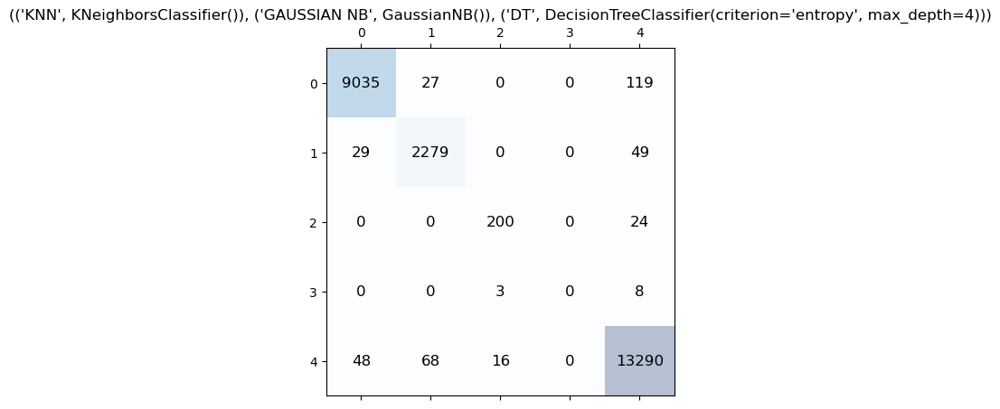

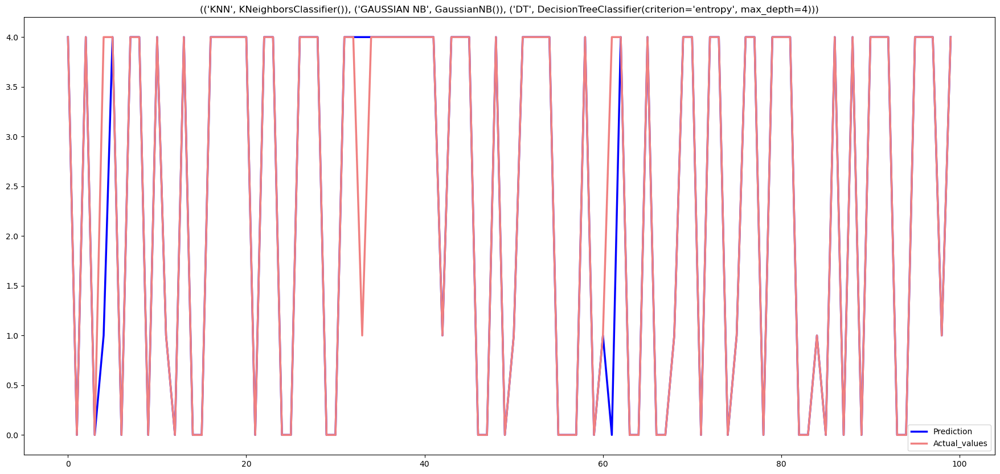



(('KNN', KNeighborsClassifier()), ('GAUSSIAN NB', GaussianNB()), ('RF', RandomForestClassifier(n_estimators=30)))
- Training time :  223.38365483283997
- Testing time :  55.337618827819824
----------------------------------
- Train Accuracy : 0.9912282442596598
- Train MCC : 0.9846920015704873
- Train F1 score : 0.9911408623943182
- Train Precision : 0.991175090682455
- Train Recall : 0.9912282442596598
- Train Cohens Kappa Score : 0.9846484479900875
- Train Log Loss : 0.02877564150748546
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9856717602698948
- Test MCC : 0.9750711079299609
- Test F1 score : 0.985567484190601
- Test Precision : 0.9855915091842955
- Test Recall : 0.9856717602698948
- Test Cohens Kappa Score : 0.9750313564542467
- Test Log Loss : 0.04825911708183602
----------------------------------
Mean Absolute Error -  0.043222861678904545
Mean Squared Error -  0.14871998412383408
Root Mean Squared Error -  0.3856423007449184
--------

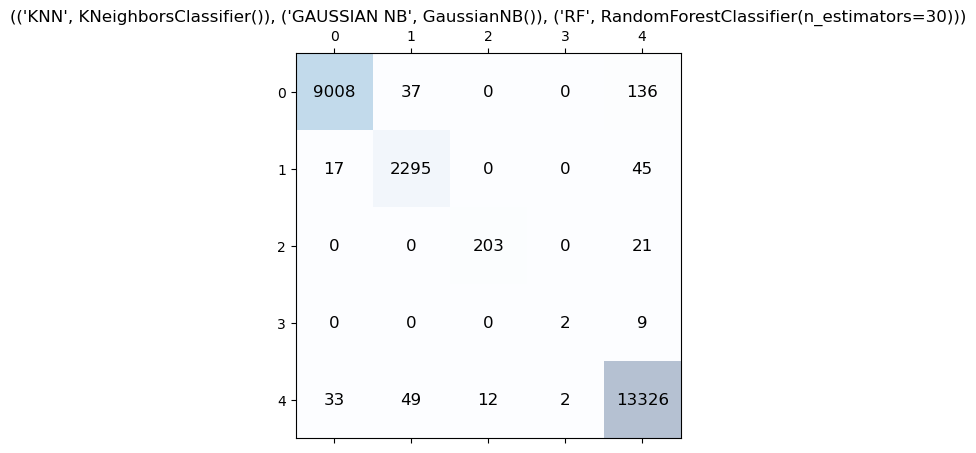

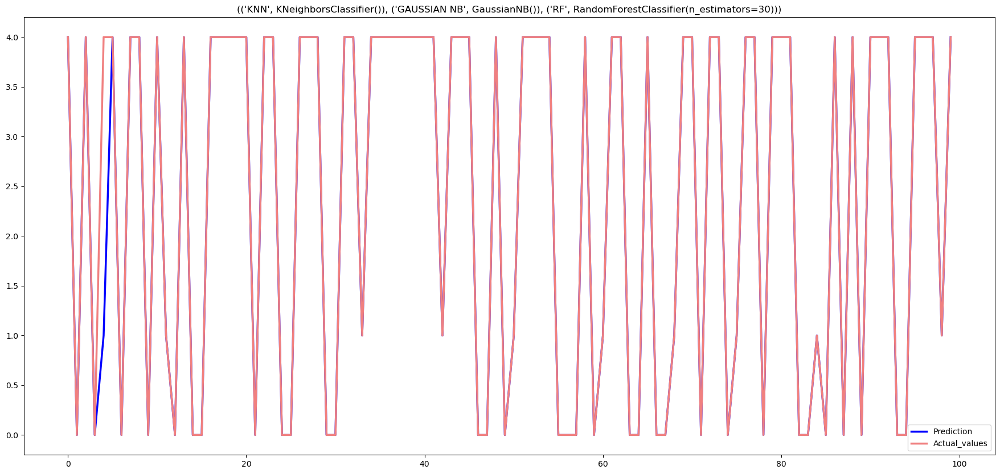



(('KNN', KNeighborsClassifier()), ('GAUSSIAN NB', GaussianNB()), ('LR', LogisticRegression(max_iter=1200000)))
- Training time :  354.202486038208
- Testing time :  97.17439198493958
----------------------------------
- Train Accuracy : 0.9875369624322768
- Train MCC : 0.9782194132983753
- Train F1 score : 0.9874485375245937
- Train Precision : 0.9874430321518493
- Train Recall : 0.9875369624322768
- Train Cohens Kappa Score : 0.9782072477557666
- Train Log Loss : 0.038523802667437226
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9834094066282992
- Test MCC : 0.9711351046738057
- Test F1 score : 0.9832865109732831
- Test Precision : 0.9832536269903815
- Test Recall : 0.9834094066282992
- Test Cohens Kappa Score : 0.9711237438514903
- Test Log Loss : 0.05791991659613567
----------------------------------
Mean Absolute Error -  0.04893828140504068
Mean Squared Error -  0.16531057749553482
Root Mean Squared Error -  0.40658403497374906
-----------

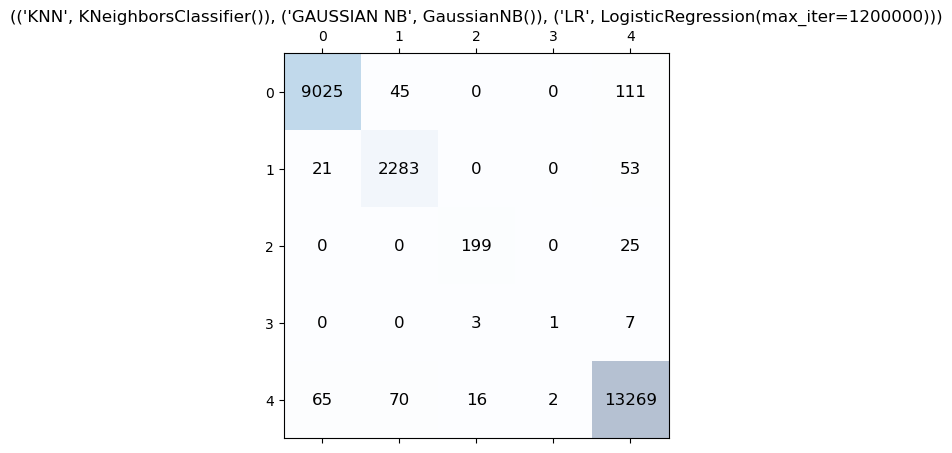

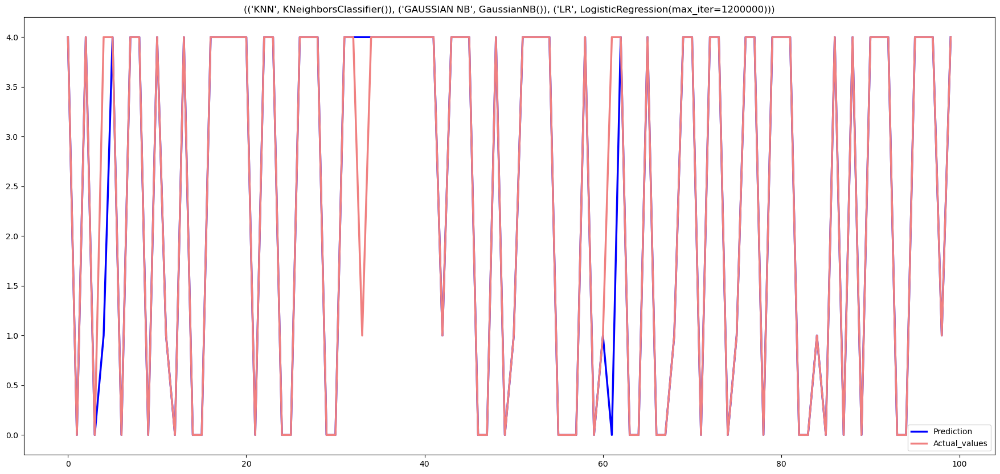

In [39]:
from itertools import combinations,product
algo_list = [
    ('KNN',knn),
    ('GAUSSIAN NB',nb),
    ('DT',dt),
    ('RF',rf),
    ('LR',lr)
    ]
list_combo = []
for n in range(len(algo_list) + 1):
    list_combo += combinations(algo_list, n)
res = list_combo[16:19]
for i in res:
    print('\n')
    print(i)
    stack_model = StackingClassifier(estimators=i, final_estimator=MLPClassifier())
    start_time = time.time()
    stack_model.fit(X_train, Y_train)
    end_time = time.time()
    print("- Training time : ",end_time-start_time)
    start_time = time.time()
    Y_test_predf1 = stack_model.predict(X_test)
    end_time = time.time()
    print("- Testing time : ",end_time-start_time)
    print('----------------------------------')
    Y_train_predf1 = stack_model.predict(X_train)
    Y_train_probsf1 = stack_model.predict_proba(X_train)
    Y_test_probsf1 = stack_model.predict_proba(X_test)

    # Training set model performance
    stack_model_train_accuracy = accuracy_score(Y_train, Y_train_predf1)
    stack_model_train_mcc = matthews_corrcoef(Y_train, Y_train_predf1)
    stack_model_train_f1 = f1_score(Y_train, Y_train_predf1, average='weighted') 
    stack_model_train_precision = precision_score(Y_train, Y_train_predf1,average='weighted')
    stack_model_train_recall = recall_score(Y_train, Y_train_predf1, average='weighted')
    stack_model_train_ckscore = cohen_kappa_score(Y_train, Y_train_predf1)
    stack_model_train_logloss = log_loss(Y_train, Y_train_probsf1)

    # Test set model performance
    stack_model_test_accuracy = accuracy_score(Y_test, Y_test_predf1) 
    stack_model_test_mcc = matthews_corrcoef(Y_test, Y_test_predf1)
    stack_model_test_f1 = f1_score(Y_test, Y_test_predf1, average='weighted')
    stack_model_test_precision = precision_score(Y_test, Y_test_predf1,average='weighted')
    stack_model_test_recall = recall_score(Y_test, Y_test_predf1, average='weighted')
    stack_model_test_ckscore = cohen_kappa_score(Y_test, Y_test_predf1)
    stack_model_test_logloss = log_loss(Y_test, Y_test_probsf1)

    print('- Train Accuracy : %s' % stack_model_train_accuracy)
    print('- Train MCC : %s' % stack_model_train_mcc)
    print('- Train F1 score : %s' % stack_model_train_f1)
    print('- Train Precision : %s' % stack_model_train_precision)
    print('- Train Recall : %s' % stack_model_train_recall)
    print('- Train Cohens Kappa Score : %s' % stack_model_train_ckscore)
    print('- Train Log Loss : %s' % stack_model_train_logloss)
    print('----------------------------------')
    print('Model performance for Test set')
    print('- Test Accuracy : %s' % stack_model_test_accuracy)
    print('- Test MCC : %s' % stack_model_test_mcc)
    print('- Test F1 score : %s' % stack_model_test_f1)
    print('- Test Precision : %s' % stack_model_test_precision)
    print('- Test Recall : %s' % stack_model_test_recall)
    print('- Test Cohens Kappa Score : %s' % stack_model_test_ckscore)
    print('- Test Log Loss : %s' % stack_model_test_logloss)
    print('----------------------------------')
    print("Mean Absolute Error - " , metrics.mean_absolute_error(Y_test, Y_test_predf1))
    print("Mean Squared Error - " , metrics.mean_squared_error(Y_test, Y_test_predf1))
    print("Root Mean Squared Error - " , np.sqrt(metrics.mean_squared_error(Y_test, Y_test_predf1)))
    print('----------------------------------')
    matrix(Y_test, Y_test_predf1, i)
    plot(Y_test, Y_test_predf1, i)



(('KNN', KNeighborsClassifier()), ('DT', DecisionTreeClassifier(criterion='entropy', max_depth=4)), ('RF', RandomForestClassifier(n_estimators=30)))
- Training time :  455.8232138156891
- Testing time :  121.98459029197693
----------------------------------
- Train Accuracy : 0.9912877810633273
- Train MCC : 0.9847906091287966
- Train F1 score : 0.9911444254584209
- Train Precision : 0.9913308197675571
- Train Recall : 0.9912877810633273
- Train Cohens Kappa Score : 0.9847584198297226
- Train Log Loss : 0.028364816355935747
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9855923794403652
- Test MCC : 0.9749276369274075
- Test F1 score : 0.9854175096206704
- Test Precision : 0.9856494282927906
- Test Recall : 0.9855923794403652
- Test Cohens Kappa Score : 0.9748944020716442
- Test Log Loss : 0.046542915420562506
----------------------------------
Mean Absolute Error -  0.04318317126413971
Mean Squared Error -  0.14677515380035722
Root Mean Squared

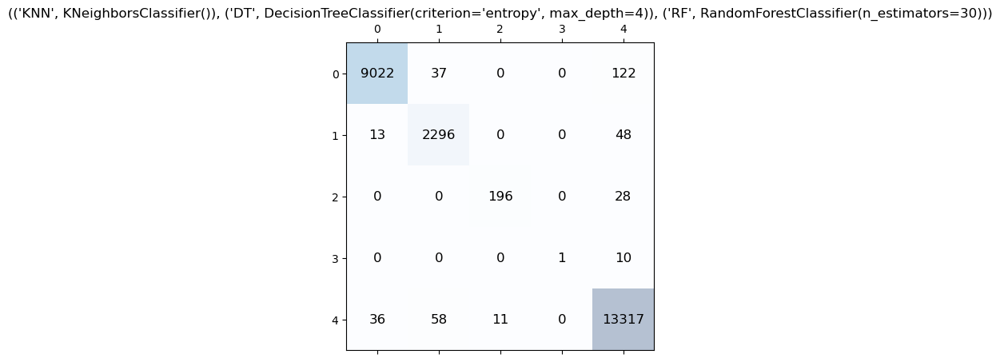

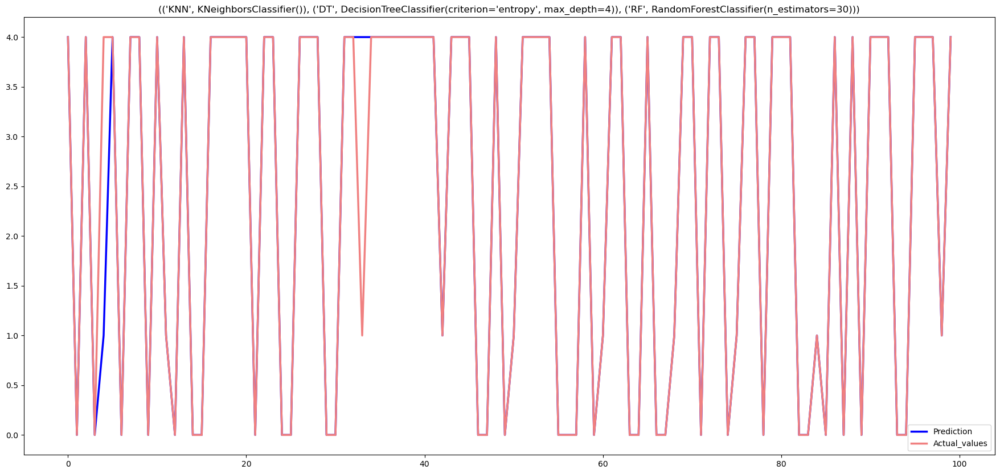



(('KNN', KNeighborsClassifier()), ('DT', DecisionTreeClassifier(criterion='entropy', max_depth=4)), ('LR', LogisticRegression(max_iter=1200000)))
- Training time :  680.8221781253815
- Testing time :  106.74397253990173
----------------------------------
- Train Accuracy : 0.9878445692512254
- Train MCC : 0.9787699952061985
- Train F1 score : 0.9877648014359098
- Train Precision : 0.9877930603339254
- Train Recall : 0.9878445692512254
- Train Cohens Kappa Score : 0.9787408309865681
- Train Log Loss : 0.03657570508957943
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9840047628497718
- Test MCC : 0.9721772689747201
- Test F1 score : 0.9838827095884546
- Test Precision : 0.9838740222284269
- Test Recall : 0.9840047628497718
- Test Cohens Kappa Score : 0.9721493927694081
- Test Log Loss : 0.05389918280179488
----------------------------------
Mean Absolute Error -  0.047271283984917645
Mean Squared Error -  0.1598333002579877
Root Mean Squared Erro

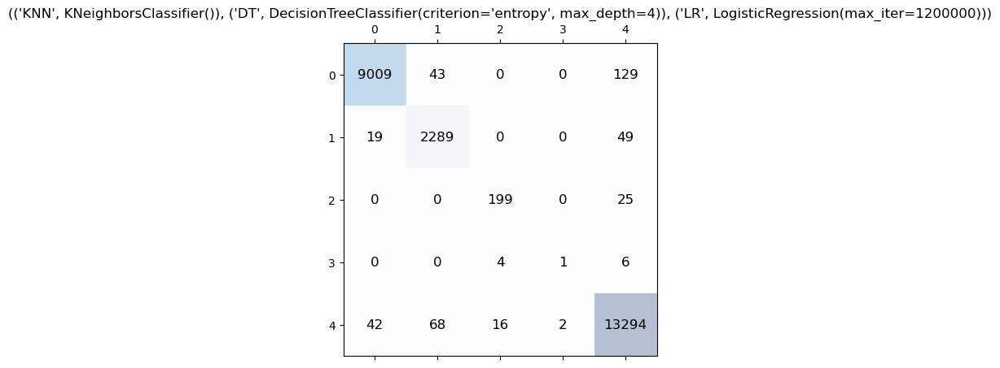

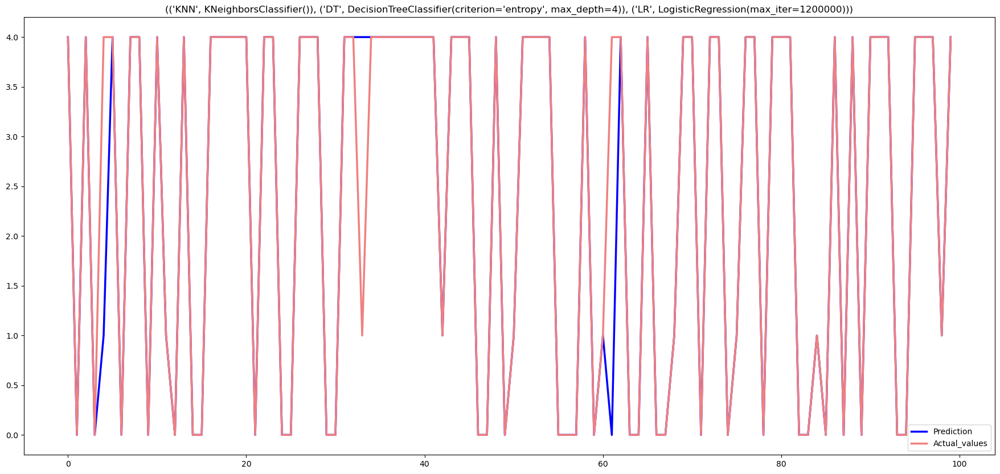



(('KNN', KNeighborsClassifier()), ('RF', RandomForestClassifier(n_estimators=30)), ('LR', LogisticRegression(max_iter=1200000)))
- Training time :  500.59493350982666
- Testing time :  80.60883736610413
----------------------------------
- Train Accuracy : 0.9917541526920558
- Train MCC : 0.9856063833794005
- Train F1 score : 0.9916936818134551
- Train Precision : 0.991734143254851
- Train Recall : 0.9917541526920558
- Train Cohens Kappa Score : 0.9855861725613546
- Train Log Loss : 0.028314008572862075
----------------------------------
Model performance for Test set
- Test Accuracy : 0.985155784877952
- Test MCC : 0.9741771634264516
- Test F1 score : 0.9850717328447456
- Test Precision : 0.9850887678473953
- Test Recall : 0.985155784877952
- Test Cohens Kappa Score : 0.9741564600266897
- Test Log Loss : 0.04792265730058892
----------------------------------
Mean Absolute Error -  0.044453264536614405
Mean Squared Error -  0.15098233776542966
Root Mean Squared Error -  0.38856445767

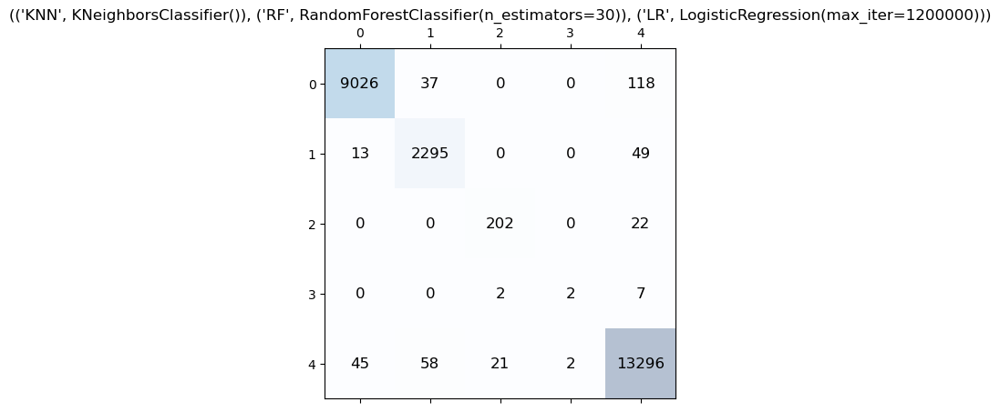

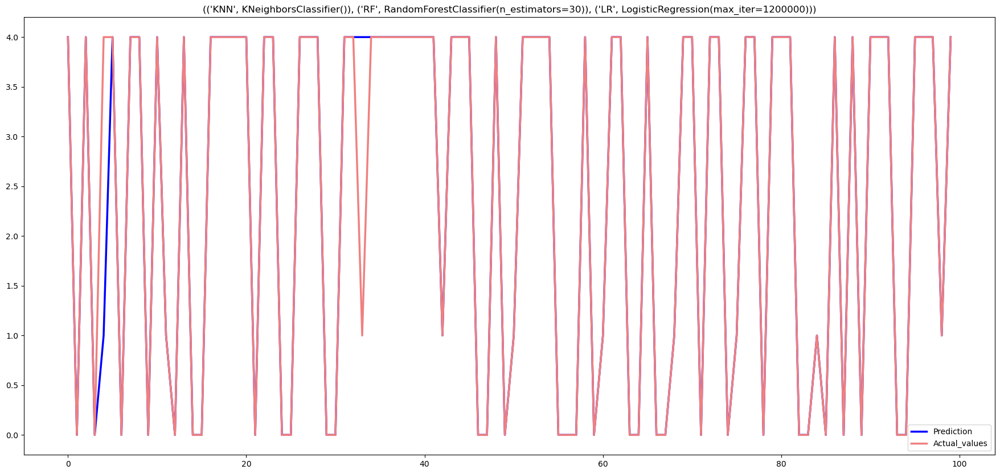



(('KNN', KNeighborsClassifier()), ('GAUSSIAN NB', GaussianNB()), ('DT', DecisionTreeClassifier(criterion='entropy', max_depth=4)), ('RF', RandomForestClassifier(n_estimators=30)), ('LR', LogisticRegression(max_iter=1200000)))
- Training time :  671.6626560688019
- Testing time :  115.81380534172058
----------------------------------
- Train Accuracy : 0.991109170652325
- Train MCC : 0.9844505123226579
- Train F1 score : 0.9910172040652644
- Train Precision : 0.9910017002526343
- Train Recall : 0.991109170652325
- Train Cohens Kappa Score : 0.9844410618677775
- Train Log Loss : 0.03100671642674261
----------------------------------
Model performance for Test set
- Test Accuracy : 0.9857908315141893
- Test MCC : 0.9752476034936273
- Test F1 score : 0.9856712055778143
- Test Precision : 0.9856391462997596
- Test Recall : 0.9857908315141893
- Test Cohens Kappa Score : 0.9752381632371889
- Test Log Loss : 0.04790063490772378
----------------------------------
Mean Absolute Error -  0.0436

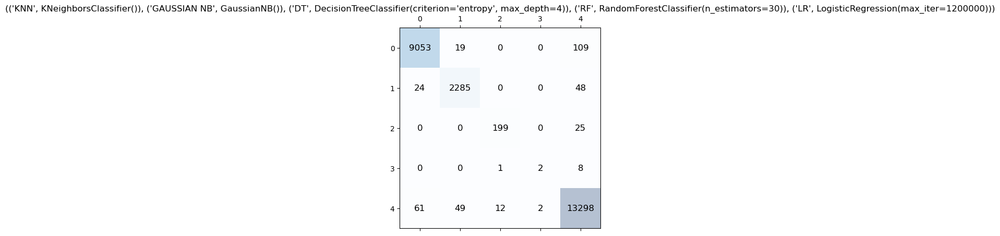

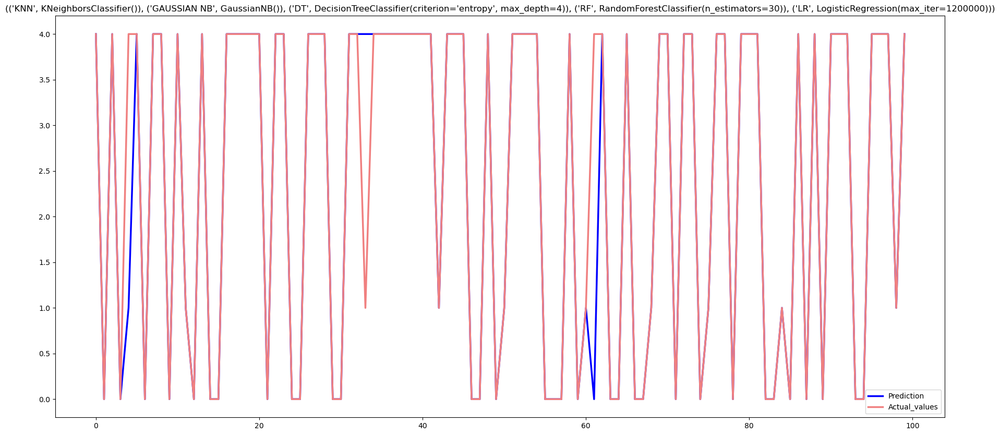

In [12]:
from itertools import combinations,product
algo_list = [
    ('KNN',knn),
    ('GAUSSIAN NB',nb),
    ('DT',dt),
    ('RF',rf),
    ('LR',lr)
    ]
list_combo = []
for n in range(len(algo_list) + 1):
    list_combo += combinations(algo_list, n)
res = list_combo[19:22]+list_combo[31:32]
for i in res:
    print('\n')
    print(i)
    stack_model = StackingClassifier(estimators=i, final_estimator=MLPClassifier())
    start_time = time.time()
    stack_model.fit(X_train, Y_train)
    end_time = time.time()
    print("- Training time : ",end_time-start_time)
    start_time = time.time()
    Y_test_predf1 = stack_model.predict(X_test)
    end_time = time.time()
    print("- Testing time : ",end_time-start_time)
    print('----------------------------------')
    Y_train_predf1 = stack_model.predict(X_train)
    Y_train_probsf1 = stack_model.predict_proba(X_train)
    Y_test_probsf1 = stack_model.predict_proba(X_test)

    # Training set model performance
    stack_model_train_accuracy = accuracy_score(Y_train, Y_train_predf1)
    stack_model_train_mcc = matthews_corrcoef(Y_train, Y_train_predf1)
    stack_model_train_f1 = f1_score(Y_train, Y_train_predf1, average='weighted') 
    stack_model_train_precision = precision_score(Y_train, Y_train_predf1,average='weighted')
    stack_model_train_recall = recall_score(Y_train, Y_train_predf1, average='weighted')
    stack_model_train_ckscore = cohen_kappa_score(Y_train, Y_train_predf1)
    stack_model_train_logloss = log_loss(Y_train, Y_train_probsf1)

    # Test set model performance
    stack_model_test_accuracy = accuracy_score(Y_test, Y_test_predf1) 
    stack_model_test_mcc = matthews_corrcoef(Y_test, Y_test_predf1)
    stack_model_test_f1 = f1_score(Y_test, Y_test_predf1, average='weighted')
    stack_model_test_precision = precision_score(Y_test, Y_test_predf1,average='weighted')
    stack_model_test_recall = recall_score(Y_test, Y_test_predf1, average='weighted')
    stack_model_test_ckscore = cohen_kappa_score(Y_test, Y_test_predf1)
    stack_model_test_logloss = log_loss(Y_test, Y_test_probsf1)

    print('- Train Accuracy : %s' % stack_model_train_accuracy)
    print('- Train MCC : %s' % stack_model_train_mcc)
    print('- Train F1 score : %s' % stack_model_train_f1)
    print('- Train Precision : %s' % stack_model_train_precision)
    print('- Train Recall : %s' % stack_model_train_recall)
    print('- Train Cohens Kappa Score : %s' % stack_model_train_ckscore)
    print('- Train Log Loss : %s' % stack_model_train_logloss)
    print('----------------------------------')
    print('Model performance for Test set')
    print('- Test Accuracy : %s' % stack_model_test_accuracy)
    print('- Test MCC : %s' % stack_model_test_mcc)
    print('- Test F1 score : %s' % stack_model_test_f1)
    print('- Test Precision : %s' % stack_model_test_precision)
    print('- Test Recall : %s' % stack_model_test_recall)
    print('- Test Cohens Kappa Score : %s' % stack_model_test_ckscore)
    print('- Test Log Loss : %s' % stack_model_test_logloss)
    print('----------------------------------')
    print("Mean Absolute Error - " , metrics.mean_absolute_error(Y_test, Y_test_predf1))
    print("Mean Squared Error - " , metrics.mean_squared_error(Y_test, Y_test_predf1))
    print("Root Mean Squared Error - " , np.sqrt(metrics.mean_squared_error(Y_test, Y_test_predf1)))
    print('----------------------------------')
    matrix(Y_test, Y_test_predf1, i)
    plot(Y_test, Y_test_predf1, i)



(('SVM', SVC(probability=True)), ('KNN', KNeighborsClassifier()))
- Training time :  9036.524065971375
- Testing time :  100.56273126602173
----------------------------------
- Train Accuracy : 0.9871003592053821
- Train MCC : 0.9774898919648378
- Train F1 score : 0.9869609542986502
- Train Precision : 0.9872129266838674
- Train Recall : 0.9871003592053821
- Train Cohens Kappa Score : 0.9774297545445675
- Train Log Loss : 0.03755019518295717
----------------------------------
Model performance for Test set
- Test Accuracy : 98.40047628497717
- Test MCC : 0.972201065755827
- Test F1 score : 0.9838068710919815
- Test Precision : 0.9837255099062038
- Test Recall : 0.9840047628497718
- Test Cohens Kappa Score : 0.9721448075563182
- Test Log Loss : 0.057109922641290375
----------------------------------
Mean Absolute Error -  0.04679499900773963
Mean Squared Error -  0.15737249454256796
Root Mean Squared Error -  0.3967020223575473
----------------------------------


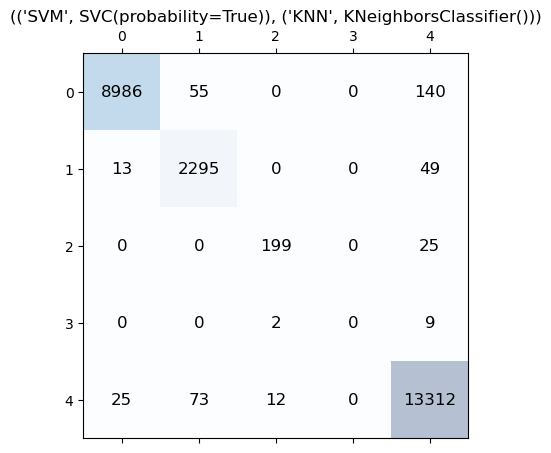

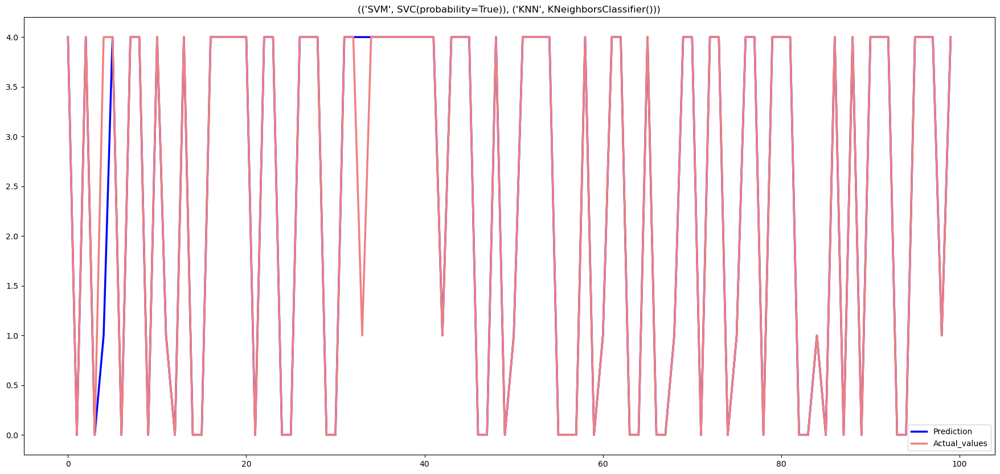



(('SVM', SVC(probability=True)), ('GAUSSIAN NB', GaussianNB()))
- Training time :  9167.122567415237
- Testing time :  49.41659593582153
----------------------------------
- Train Accuracy : 0.9776637758240886
- Train MCC : 0.960900960918981
- Train F1 score : 0.9772072606507822
- Train Precision : 0.9774493034550157
- Train Recall : 0.9776637758240886
- Train Cohens Kappa Score : 0.9607879065685768
- Train Log Loss : 0.07538339255416317
----------------------------------
Model performance for Test set
- Test Accuracy : 97.59872990672753
- Test MCC : 0.9581312404395128
- Test F1 score : 0.9754893440898986
- Test Precision : 0.9753457402197183
- Test Recall : 0.9759872990672752
- Test Cohens Kappa Score : 0.9580412094905594
- Test Log Loss : 0.08332820899242896
----------------------------------
Mean Absolute Error -  0.06572732685056559
Mean Squared Error -  0.21107362571938876
Root Mean Squared Error -  0.45942749778326153
----------------------------------


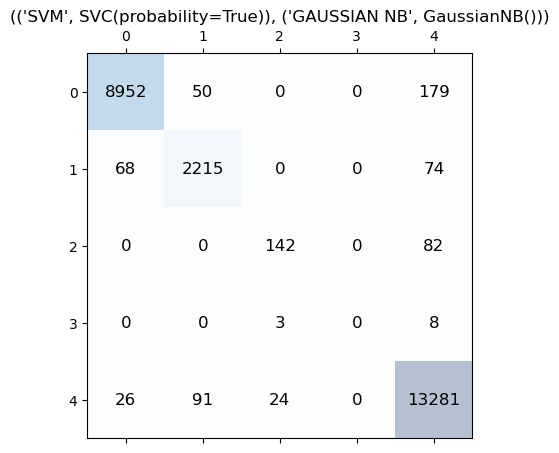

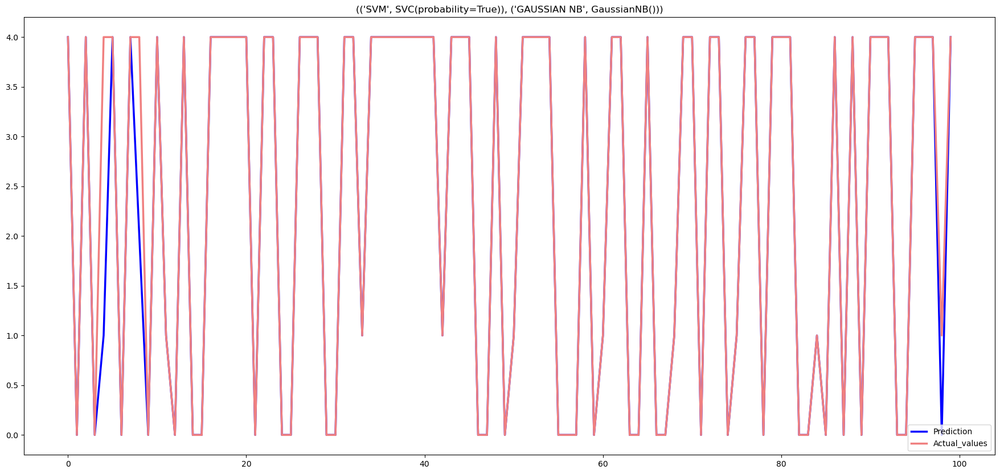



(('SVM', SVC(probability=True)), ('DT', DecisionTreeClassifier(criterion='entropy', max_depth=4)))
- Training time :  9820.51997256279
- Testing time :  71.98656749725342
----------------------------------
- Train Accuracy : 0.9797376411518387
- Train MCC : 0.9645987681956447
- Train F1 score : 0.979469758525086
- Train Precision : 0.979702677790475
- Train Recall : 0.9797376411518387
- Train Cohens Kappa Score : 0.9645265003493361
- Train Log Loss : 0.06739757719498203
----------------------------------
Model performance for Test set
- Test Accuracy : 97.92816034927566
- Test MCC : 0.9639516439766997
- Test F1 score : 0.9790332819865856
- Test Precision : 0.9788970850456218
- Test Recall : 0.9792816034927565
- Test Cohens Kappa Score : 0.963899029540077
- Test Log Loss : 0.07146701279150136
----------------------------------
Mean Absolute Error -  0.060329430442548126
Mean Squared Error -  0.19876959714229014
Root Mean Squared Error -  0.44583584102479934
---------------------------

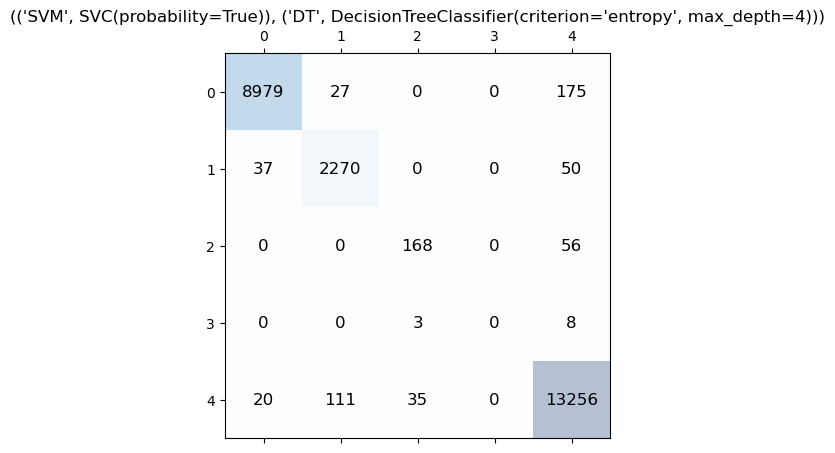

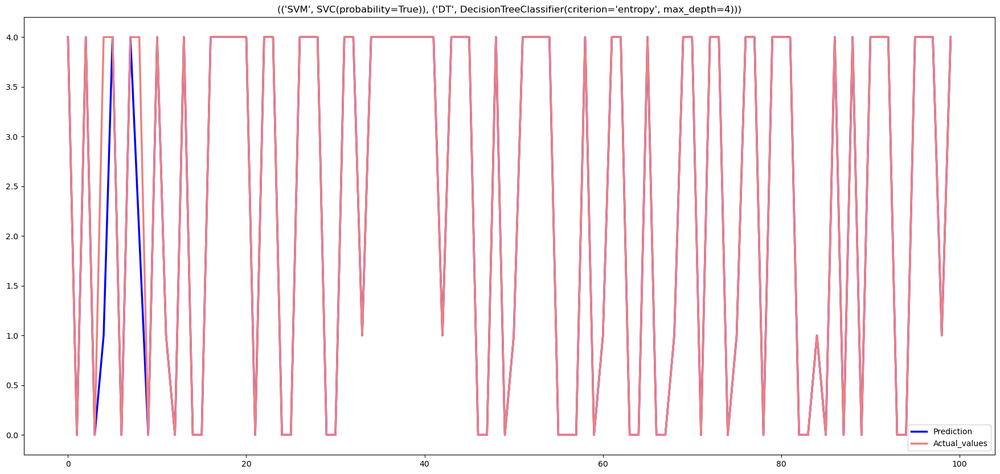



(('SVM', SVC(probability=True)), ('RF', RandomForestClassifier(n_estimators=30)))


In [ ]:
from itertools import combinations,product
algo_list = [
    ('SVM',SVC(gamma = 'scale',probability=True)),
    ('KNN',knn),
    ('GAUSSIAN NB',nb),
    ('DT',dt),
    ('RF',rf),
    ('LR',lr)
    ]
list_combo = []
for n in range(len(algo_list) + 1):
    list_combo += combinations(algo_list, n)
res = list_combo[7:12]
for i in res:
    print('\n')
    print(i)
    stack_model = StackingClassifier(estimators=i, final_estimator=MLPClassifier())
    start_time = time.time()
    stack_model.fit(X_train, Y_train)
    end_time = time.time()
    print("- Training time : ",end_time-start_time)
    start_time = time.time()
    Y_test_predf1 = stack_model.predict(X_test)
    end_time = time.time()
    print("- Testing time : ",end_time-start_time)
    print('----------------------------------')
    Y_train_predf1 = stack_model.predict(X_train)
    Y_train_probsf1 = stack_model.predict_proba(X_train)
    Y_test_probsf1 = stack_model.predict_proba(X_test)
    # Training set model performance
    stack_model_train_accuracy = accuracy_score(Y_train, Y_train_predf1)
    stack_model_train_mcc = matthews_corrcoef(Y_train, Y_train_predf1)
    stack_model_train_f1 = f1_score(Y_train, Y_train_predf1, average='weighted') 
    stack_model_train_precision = precision_score(Y_train, Y_train_predf1,average='weighted')
    stack_model_train_recall = recall_score(Y_train, Y_train_predf1, average='weighted')
    stack_model_train_ckscore = cohen_kappa_score(Y_train, Y_train_predf1)
    stack_model_train_logloss = log_loss(Y_train, Y_train_probsf1)

    # Test set model performance
    stack_model_test_accuracy = accuracy_score(Y_test, Y_test_predf1)*100 
    stack_model_test_mcc = matthews_corrcoef(Y_test, Y_test_predf1)
    stack_model_test_f1 = f1_score(Y_test, Y_test_predf1, average='weighted')
    stack_model_test_precision = precision_score(Y_test, Y_test_predf1,average='weighted')
    stack_model_test_recall = recall_score(Y_test, Y_test_predf1, average='weighted')
    stack_model_test_ckscore = cohen_kappa_score(Y_test, Y_test_predf1)
    stack_model_test_logloss = log_loss(Y_test, Y_test_probsf1)

    print('- Train Accuracy : %s' % stack_model_train_accuracy)
    print('- Train MCC : %s' % stack_model_train_mcc)
    print('- Train F1 score : %s' % stack_model_train_f1)
    print('- Train Precision : %s' % stack_model_train_precision)
    print('- Train Recall : %s' % stack_model_train_recall)
    print('- Train Cohens Kappa Score : %s' % stack_model_train_ckscore)
    print('- Train Log Loss : %s' % stack_model_train_logloss)
    print('----------------------------------')
    print('Model performance for Test set')
    print('- Test Accuracy : %s' % stack_model_test_accuracy)
    print('- Test MCC : %s' % stack_model_test_mcc)
    print('- Test F1 score : %s' % stack_model_test_f1)
    print('- Test Precision : %s' % stack_model_test_precision)
    print('- Test Recall : %s' % stack_model_test_recall)
    print('- Test Cohens Kappa Score : %s' % stack_model_test_ckscore)
    print('- Test Log Loss : %s' % stack_model_test_logloss)
    print('----------------------------------')
    print("Mean Absolute Error - " , metrics.mean_absolute_error(Y_test, Y_test_predf1))
    print("Mean Squared Error - " , metrics.mean_squared_error(Y_test, Y_test_predf1))
    print("Root Mean Squared Error - " , np.sqrt(metrics.mean_squared_error(Y_test, Y_test_predf1)))
    print('----------------------------------')
    matrix(Y_test, Y_test_predf1, i)
    plot(Y_test, Y_test_predf1, i)